# Autoencoders with TensorFlow

Andrii Yerko KA-81

In [2]:
# if using Colab - run this cell for saving on the Google Drive
from pathlib import Path
from google.colab import drive

drive.mount('/content/gdrive')

Path("gdrive/MyDrive/lab4_autoencoder").mkdir(parents=True, exist_ok=True)

%cd /content/gdrive/MyDrive/lab4_autoencoder

Mounted at /content/gdrive
/content/gdrive/MyDrive/lab4_autoencoder


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

from IPython.display import clear_output

%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    print('GPU device not found')
print('Found GPU at: {}'.format(device_name))
tf.config.threading.set_intra_op_parallelism_threads(0)

from tensorflow.keras import Model, Sequential, Input, initializers, optimizers, callbacks, layers

from tensorflow.keras.layers import AveragePooling2D, BatchNormalization, Conv2D, Dense, Dropout, Flatten, GaussianNoise, MaxPool2D, Reshape
from tensorflow.keras.metrics import AUC

from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import TensorBoard
%load_ext tensorboard

!pip install tensorflow_addons
import tensorflow_addons as tfa
from tensorflow_addons.metrics import F1Score

SEED = 413

def manhattan_distance(x, y):
  return np.sum(np.abs(x-y))

# Варіант 3: Датасет Cifar10
from tensorflow.keras.datasets.cifar10 import load_data

Found GPU at: /device:GPU:0
     |████████████████████████████████| 706kB 5.6MB/s 


# Data loading

In [4]:
(X_train, y_train), (X_test, y_test) = load_data()
# original dataset is splitted 5:1, so according to the task we should resplit it

X = np.vstack([X_train, X_test]) / 255
y = np.vstack([y_train, y_test])
n_classes = len(np.unique(y))
y = to_categorical(y)

X_train, X_hold, y_train, y_hold = \
                        train_test_split(X, y, test_size=0.3, random_state=SEED)

X_val, X_test, y_val, y_test = train_test_split(X_hold, y_hold, test_size=0.5, random_state=SEED)

X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape

170500096/170498071 [==============================] - 11s 0us/step


((42000, 32, 32, 3),
 (9000, 32, 32, 3),
 (9000, 32, 32, 3),
 (42000, 10),
 (9000, 10),
 (9000, 10))

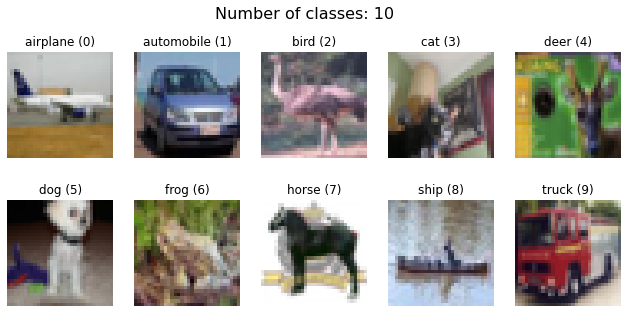

In [ ]:
labels = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

fig, axs = plt.subplots(2, 5, figsize=(11, 5))
fig.suptitle(f"Number of classes: {n_classes}", fontsize=16)

for i, ax in enumerate(axs.flatten()):
    ind = np.random.choice(np.nonzero(y_train[:, i])[0])
    ax.imshow(X_train[ind])
    ax.set_title(f'{labels[i]} ({i})')
    ax.axis('off')

Отже, маємо датасет з 60000 (42000:9000:9000) rgb-зображень розміром 32х32, що рівномірно розподілені по 10 класам

# Dense denoising autoencoder

In [ ]:
fit_params = {
    'x': X_train,
    'y': X_train,
    'validation_data': (X_val, X_val),
}

compilation_params = {
    'optimizer': 'adam',
    'loss': 'binary_crossentropy'
}


early_stopping = callbacks.EarlyStopping(monitor='val_loss', min_delta=0,
                                         patience=15, verbose=1, mode='auto',
                                         restore_best_weights=True)

In [ ]:
def create_autoencoder(units, noise=None, noise_param=0., activation='relu', orig_dim=(32, 32, 3)):
    '''
    Creates dense denoising autoencoder with Keras layers
    Params:
    units: list[int] - number of units in encoder hidden layers
                       for decoder part reverse(units) is used
    noise: 'dropout', 'gaussian' or None
    noise_param: float, dropout probability or gaussian stddev
    activation: string, activation function for each layer except the last
    orig_dim: input shape 
    '''
    orig_flat_dim = np.prod(orig_dim)
    encoded_dim = (units[-1],)

    input_enc = Input(orig_dim)
    x = Flatten()(input_enc)
    if noise == 'dropout':
        x = Dropout(noise_param)(x)
    elif noise == 'gaussian':
        x = GaussianNoise(noise_param)(x)

    for u in units:
        x = Dense(u, activation=activation)(x)
    encoded = x

    input_dec = Input(encoded_dim)
    x = input_dec
    for u in reversed(units[:-1]):
        x = Dense(u, activation=activation)(x)
    x = Dense(orig_flat_dim, activation='sigmoid')(x)
    decoded = Reshape(orig_dim)(x)

    encoder = Model(input_enc, encoded, name="encoder")
    decoder = Model(input_dec, decoded, name="decoder")
    autoencoder = Model(input_enc, decoder(encoder(input_enc)), name="autoencoder")
    return encoder, decoder, autoencoder

Переконаємось, що наша функція працює корректно

In [ ]:
encoder, decoder, autoencoder = create_autoencoder([378, 50], 'dropout', 0.3)

encoder.summary()
decoder.summary()
autoencoder.summary()

Model: "encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 32, 32, 3)]       0         
_________________________________________________________________
flatten_12 (Flatten)         (None, 3072)              0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 3072)              0         
_________________________________________________________________
dense_46 (Dense)             (None, 378)               1161594   
_________________________________________________________________
dense_47 (Dense)             (None, 50)                18950     
Total params: 1,180,544
Trainable params: 1,180,544
Non-trainable params: 0
_________________________________________________________________
Model: "decoder"
_________________________________________________________________
Layer (type)                 Out

In [ ]:
from matplotlib.gridspec import GridSpec
import seaborn as sns
sns.set_style("whitegrid")

def visualize_validation(param_grid, other_params, epochs=2):
    '''
    Fits autoencoders defined by passed parameters and plots
    reconstruction examples, learning curves and comapring pointplot

    Params:
    # all param_names must be supported by create_autoencoder()
    param_grid: dict of single value {param_name: [list of values to try]}
    other_params: dict in format {param_name: value} params that will be the same for all models
    epochs: number of fit epochs
    '''
    # images are going to be visualized
    X_viz = X_train[888:888+4]

    # final results for each params
    final_val = []
    final_train = [] 
    active_units = []

    # extracting params from dict
    param_name = list(param_grid.keys())[0]
    param_axis = param_grid[param_name]

    # plot grid
    num_rows = len(param_axis) + 1
    fig = plt.figure(constrained_layout=True, figsize=(12, 3.3*num_rows + 2))
    gs = GridSpec(2*num_rows, 8, figure=fig)

    for i, param in enumerate(param_axis):
        print(f'Fitting {i+1}/{num_rows-1}')

        # fitting autoencoder and building prediction
        encoder, decoder, autoencoder = create_autoencoder(**{param_name: param}, **other_params)
        autoencoder.compile(**compilation_params)
        history = autoencoder.fit(**fit_params, epochs=epochs)
        X_pred = autoencoder.predict(X_viz)

        # plotting images and their reconstructions
        for j in range(4):
          ax = fig.add_subplot(gs[2*i, j])
          ax.imshow(X_viz[j])
          ax.axis('off')
          ax = fig.add_subplot(gs[2*i+1, j])
          ax.imshow(X_pred[j])
          ax.axis('off')
        ax = fig.add_subplot(gs[2*i : 2*i+2, 4:])
        
        # plotting learning curves
        loss = history.history['loss']
        val_loss = history.history['val_loss']
        final_train.append(loss[-1])
        final_val.append(val_loss[-1])
        ax.plot(loss, label=f'train, {loss[-1]:.5f}')
        ax.plot(val_loss, label=f'validation, {val_loss[-1]:.5f}')
        ax.legend(fontsize=12)
        
        # add title with current param
        ax = fig.add_subplot(gs[2*i : 2*i+2, :4])
        ax.axis('off')
        ax.set_title(f"with {param}", fontsize=14)

        X_pred = encoder.predict(X_train)
        active_units.append((X_pred.mean(axis=0) > 1e-5).sum())
        clear_output()

    # final pointplot
    colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    ax = fig.add_subplot(gs[-2:, :])

    x_ticks = [f'{p}\n\n active: {active_units[i]}' for i,p  in enumerate(param_axis)]
    sns.pointplot(x=x_ticks, y=final_train,
                  ax=ax, color=colors[0])
    sns.pointplot(x=x_ticks, y=final_val,
                  ax=ax, color=colors[1])
    ax.set_title('Summary', fontsize=14)

    fig.suptitle(f"{other_params} after {epochs} epochs", fontsize=16)

    plt.show()

## ReLU activation

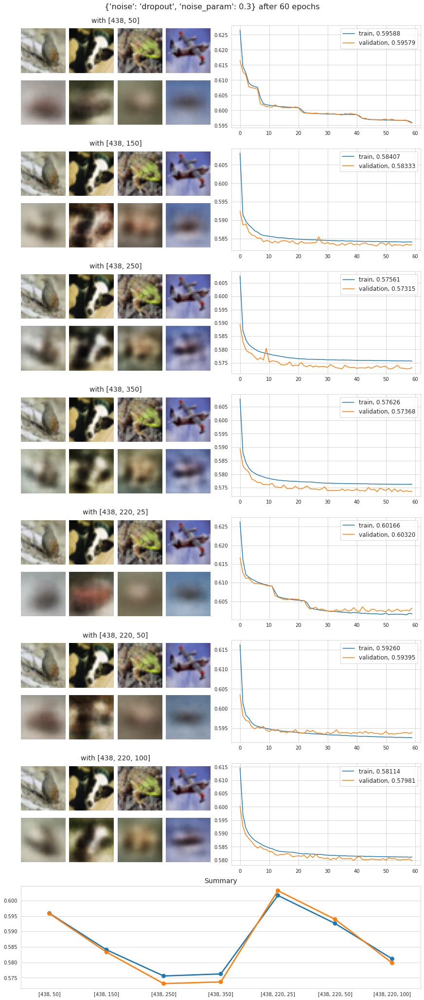

In [ ]:
params = {'noise':'dropout', 'noise_param':0.3}
grid = {
    'units': [
        [438, 50],
        [438, 150],
        [438, 250],
        [438, 350],
        [438, 220, 25],
        [438, 220, 50],
        [438, 220, 100],
    ]
}

visualize_validation(grid, params, epochs=60)

### Extension of the coding layer 

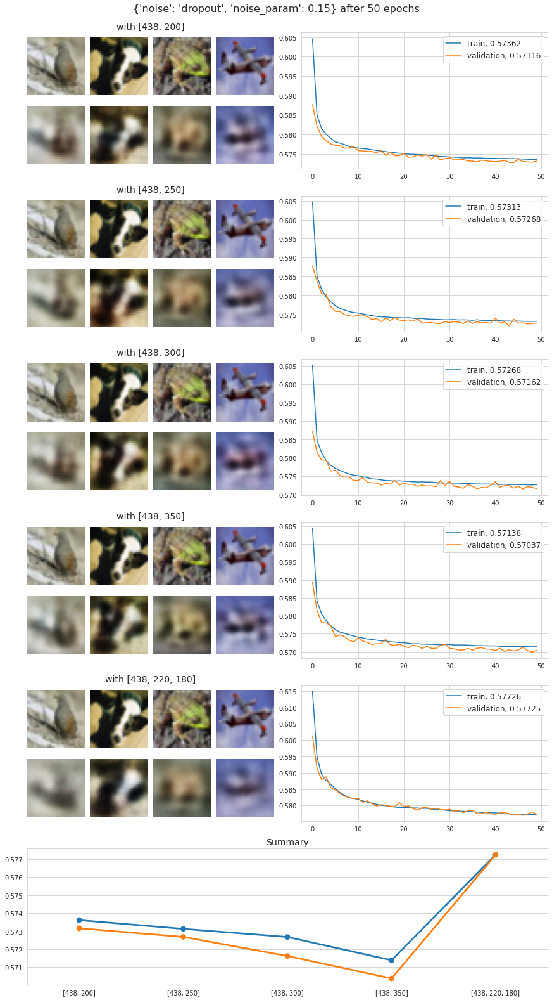

In [ ]:
params = {'noise':'dropout', 'noise_param':0.15}
grid = {
    'units': [
        [438, 200],
        [438, 250],
        [438, 300],
        [438, 350],
        [438, 220, 180],
    ]
}

visualize_validation(grid, params, epochs=50)

Суттєвого покращення результатів не спостерігається, ймовірно, проблема полягає в занадто стрімкому зменшенні розмірності на першому прихованому шарі (3072 -> 438). Спробуємо збільшити кількість нейронів у цьому шарі

### Extension of the hidden layer

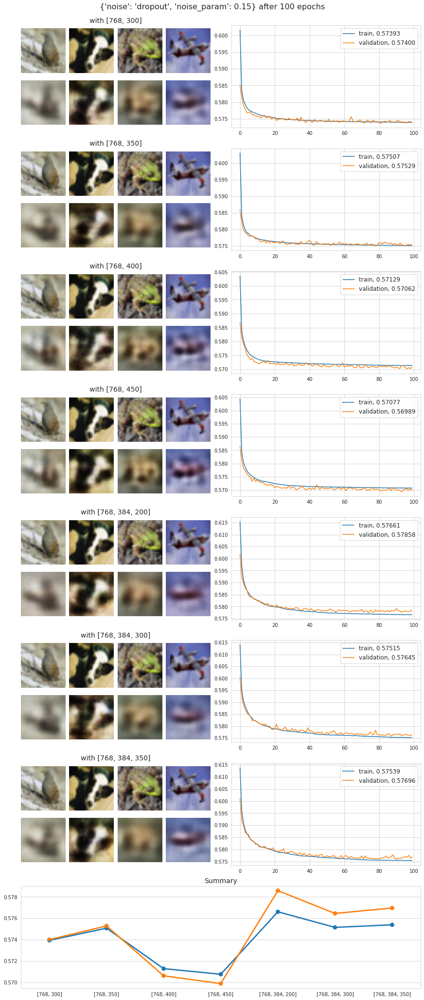

In [ ]:
params = {'noise':'dropout', 'noise_param':0.15}
grid = {
    'units': [
        [768, 300],
        [768, 350],
        [768, 400],
        [768, 450],
        [768, 384, 200],
        [768, 384, 300],
        [768, 384, 350],
    ]
}

visualize_validation(grid, params, epochs=100)

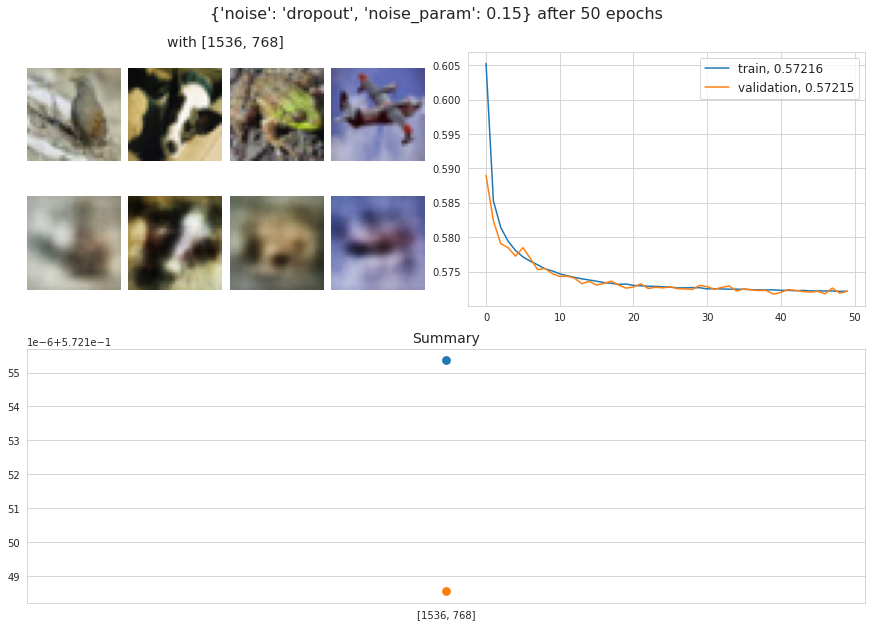

In [ ]:
params = {'noise':'dropout', 'noise_param':0.15}
grid = {
    'units': [
        [1536, 768],
    ]
}

visualize_validation(grid, params, epochs=50)

Суттєвого покращення не спостерігається, при цьому кількість параметрів сильно збільшується

### Dying ReLU problem

In [ ]:
encoder, decoder, autoencoder = create_autoencoder([768, 400], 'dropout', 0.15)
autoencoder.compile(**compilation_params)
autoencoder.fit(**fit_params, epochs=50)
clear_output()

In [ ]:
X_pred = encoder.predict(X_train)
(X_pred.mean(axis=0) != 0).sum()

56

Помітимо, що всі розглянуті моделі мають в кодуючому шарі доволі велику частину нейронів, що не активуються ніколи. Можливо, це пов'язано з "відмиранням ReLU". Спробуємо побудувати моделі з сигмоїдною активацією, та включимо до процесу валідації підрахунок активних на навчальній вибірці нейронів

## Sigmoid activation

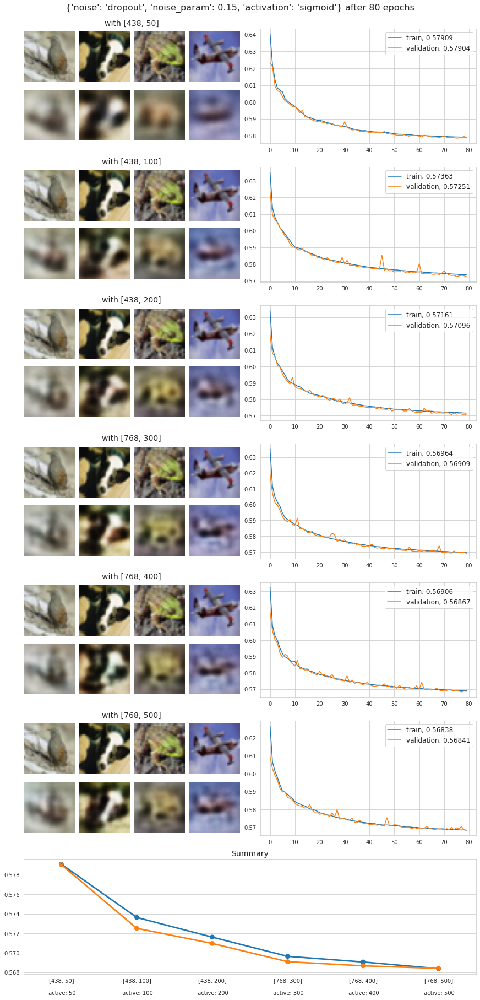

In [ ]:
params = {'noise':'dropout', 'noise_param':0.15, 'activation':'sigmoid'}
grid = {
    'units': [
        [438, 50],
        [438, 100],
        [438, 200],
        [768, 300],
        [768, 400],
        [768, 500]
    ] 
}

visualize_validation(grid, params, epochs=80)

### Noise tuning

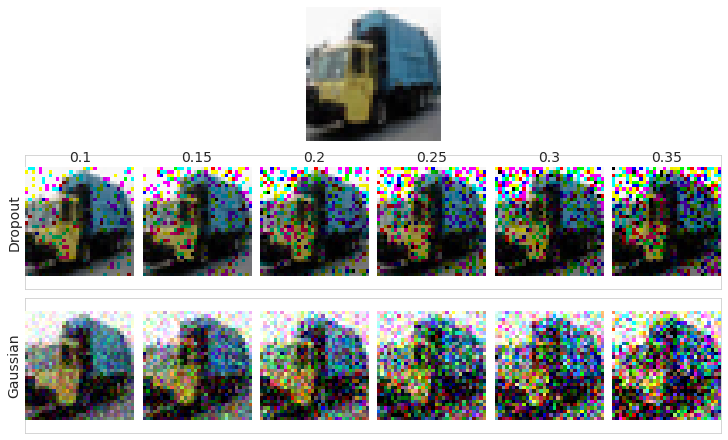

In [ ]:
from matplotlib.gridspec import GridSpec
params = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35]

fig = plt.figure(constrained_layout=True, figsize=(10, 6))
gs = GridSpec(3, 6, figure=fig)

img = X_train[None, 89]

ax = fig.add_subplot(gs[0, :])
ax.imshow(img[0])
ax.axis('off')
ax = fig.add_subplot(gs[1, :])
ax.tick_params(axis='both', which='both', bottom=False, top=False,
                left=False, right=False, labelbottom=False, labelleft=False)
ax.grid(False)
ax.set_ylabel("Dropout", fontsize=14)
ax = fig.add_subplot(gs[2, :])
ax.tick_params(axis='both', which='both', bottom=False, top=False,
                left=False, right=False, labelbottom=False, labelleft=False)
ax.grid(False)
ax.set_ylabel("Gaussian", fontsize=14)
for i, param in enumerate(params):
    ax = fig.add_subplot(gs[1, i])
    ax.imshow(tf.nn.dropout(img, param)[0] * (1 - param))
    ax.axis('off')
    ax.set_title(param, fontsize=14)
    ax = fig.add_subplot(gs[2, i])
    noised = img + np.random.normal(loc=0.0, scale=param, size=img.shape) 
    ax.imshow(noised[0])
    ax.axis('off')
clear_output()

#### Dropout noise

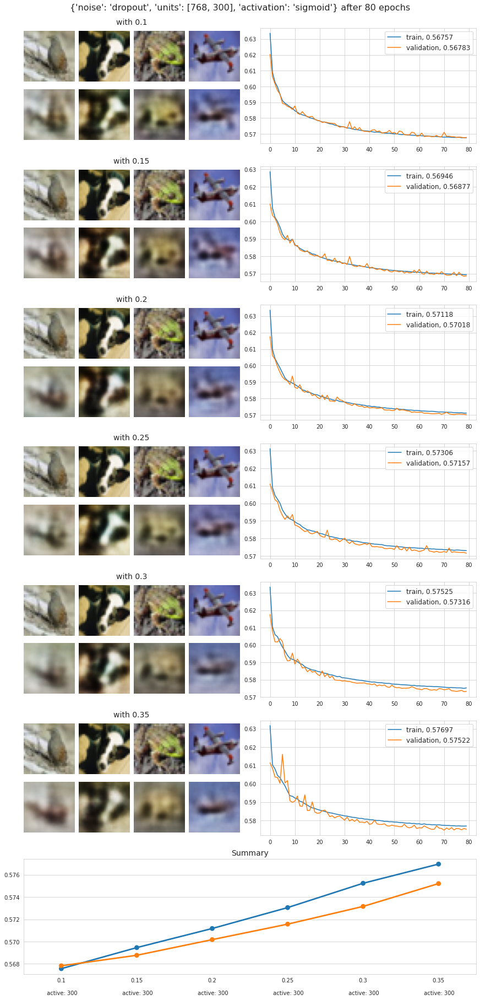

In [ ]:
params = {'noise':'dropout', 'units':[768, 300], 'activation':'sigmoid'}
grid = {
    'noise_param': [
        0.1,
        0.15,
        0.2,
        0.25,
        0.3,
        0.35
    ]
}

visualize_validation(grid, params, epochs=80)

#### Gaussian noise

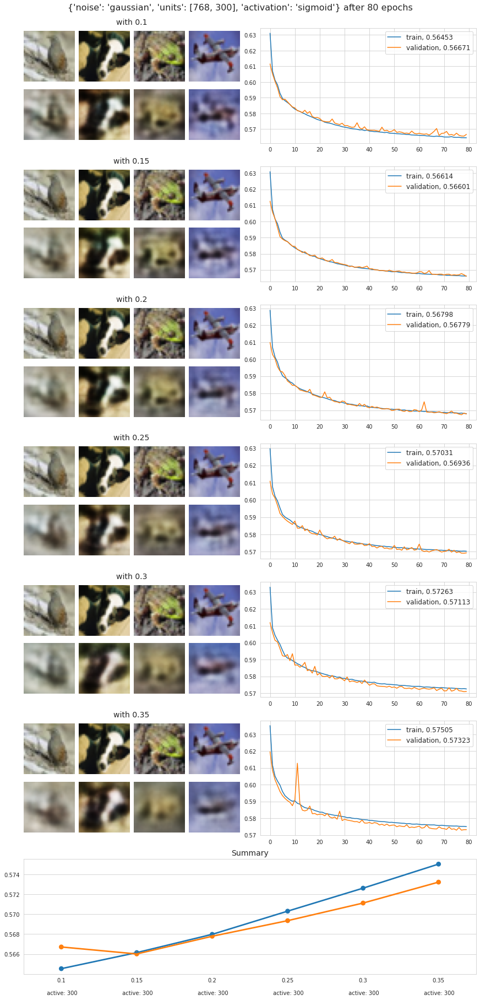

In [ ]:
params = {'noise':'gaussian', 'units':[768, 300], 'activation':'sigmoid'}
grid = {
    'noise_param': [
        0.1,
        0.15,
        0.2,
        0.25,
        0.3,
        0.35
    ]
}

visualize_validation(grid, params, epochs=80)

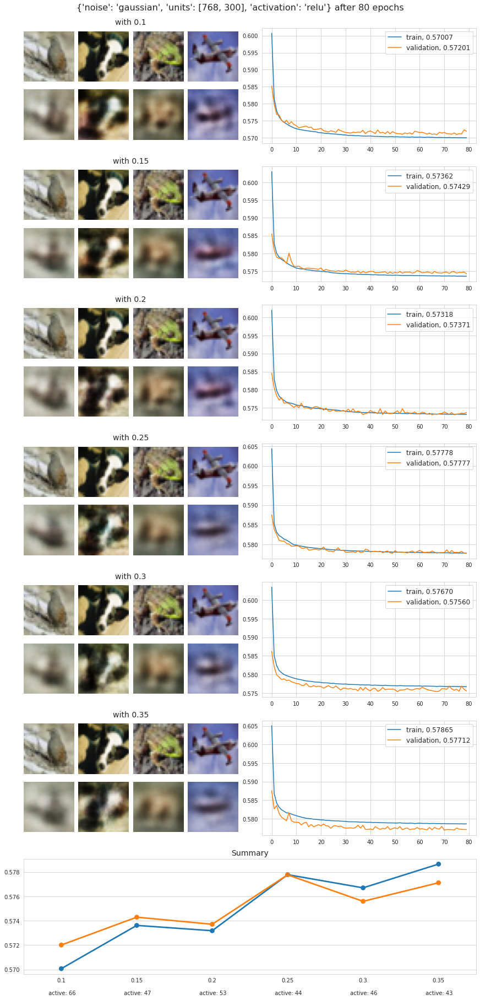

In [ ]:
params = {'noise':'gaussian', 'units':[768, 300], 'activation':'relu'}
grid = {
    'noise_param': [
        0.1,
        0.15,
        0.2,
        0.25,
        0.3,
        0.35
    ]
}

visualize_validation(grid, params, epochs=80)

Приходимо до висновку, що найкращою моделлю є модель з додаванням гаусівського шуму з $\sigma=0.15$, скритим шаром в 784 нейрони та кодуючим в 300, усі з сигмоїдною активацією

In [ ]:
# encoder, decoder, autoencoder = create_autoencoder([784, 300], 'gaussian', 0.15, 'sigmoid')

checkpoint_filepath = 'tmp/checkpoint'
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_loss',
    mode='min',
    save_best_only=True
    )

early_stopping = callbacks.EarlyStopping(monitor='val_loss', min_delta=0,
                                         patience=15, verbose=1, mode='auto',
                                         restore_best_weights=True)

# autoencoder.compile(**compilation_params)
autoencoder.fit(**fit_params, epochs=400, initial_epoch=132,
                callbacks=[
                      model_checkpoint_callback,
                      early_stopping,
                      TensorBoard(log_dir="logs/dense_autoencoder/")
                  ]
                )
autoencoder.save('models/dense_autoencoder')

Epoch 133/400
1313/1313 [==============================] - 6s 4ms/step - loss: 0.5644 - val_loss: 0.5657
INFO:tensorflow:Assets written to: tmp/checkpoint/assets
Epoch 134/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5643 - val_loss: 0.5645
INFO:tensorflow:Assets written to: tmp/checkpoint/assets
Epoch 135/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5644 - val_loss: 0.5651
Epoch 136/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5642 - val_loss: 0.5651
Epoch 137/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5643 - val_loss: 0.5649
Epoch 138/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5644 - val_loss: 0.5647
Epoch 139/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5642 - val_loss: 0.5648
Epoch 140/400
1313/1313 [==============================] - 5s 4ms/step - loss: 0.5642 - val_loss: 0.5662
Epoch 141/400
1313/1313 [=====================

In [ ]:
encoder.save('v1_encoder')
decoder.save('v1_decoder')

INFO:tensorflow:Assets written to: v1_encoder/assets
INFO:tensorflow:Assets written to: v1_decoder/assets


## Results

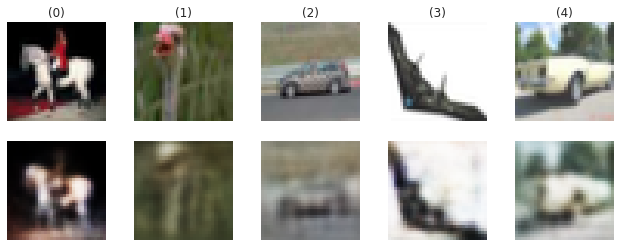

In [ ]:
fig, axs = plt.subplots(2, 5, figsize=(11, 4))

idx = 123
X_viz = X_test[idx: idx+5]
X_pred = autoencoder.predict(X_viz)

for i in range(5):
    axs[0, i].imshow(X_viz[i])
    axs[0, i].set_title(f'({i})')
    axs[0, i].axis('off')

    axs[1, i].imshow(X_pred[i])
    axs[1, i].axis('off')

Реконструкції є доволі розмитими, але контрастні об'єкти чітко виділяються. Це здебільшого пов'язано з значно меншою розмірністю простору кодів (приблизно в 10 разів менше за розмірність вихідних зображень), що і стирає межі між подібними за кольором областями

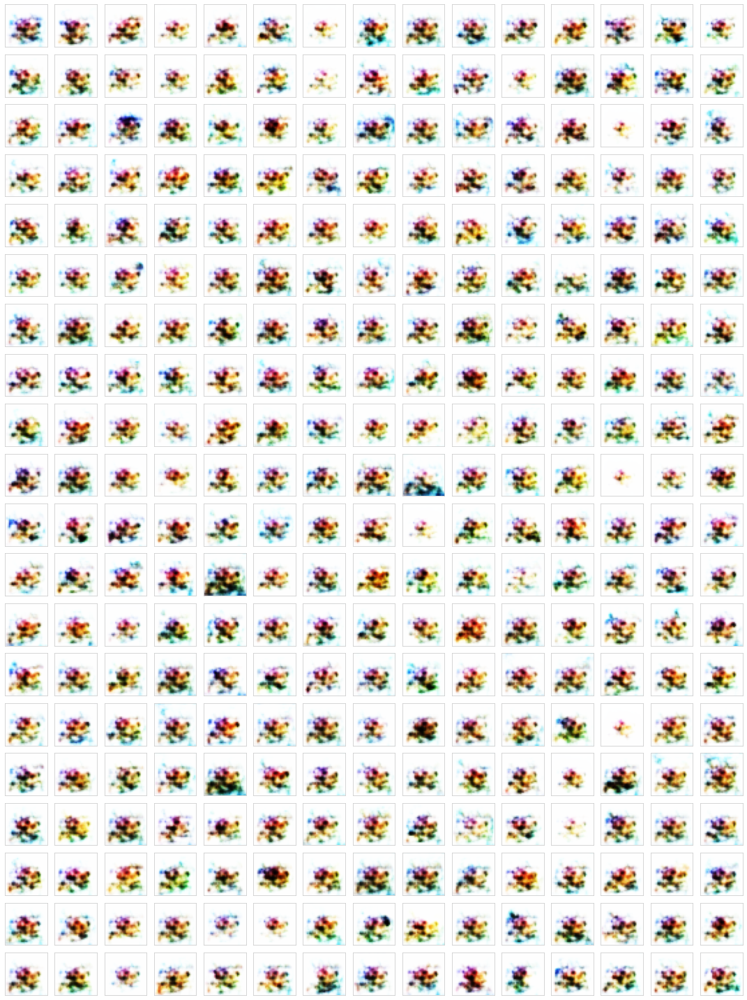

In [ ]:
codes = np.eye(300)
features = decoder.predict(codes)

fig, axs = plt.subplots(20, 15, figsize=(15, 20))

for i, ax in enumerate(axs.flatten()):
    ax.imshow(features[i])
    # ax.axis('off')
    ax.tick_params(axis='both', which='both',
                   bottom=False, top=False,
                   left=False, right=False,
                   labelbottom=False, labelleft=False)
    ax.grid(False)

plt.tight_layout()
plt.show()

Ознаки, які відповідають елементам коду абсолютно не інтерпретовні, оскільки представляють собою скупчення хмар різного кольору неправильної форми 

## Building a classifier

In [ ]:
metrics = [
    'accuracy',
    F1Score(10, average='macro', name='f1'),
    AUC(name='auc')
]

classifier_fit_params = {
    'x': X_train,
    'y': y_train,
    'validation_data': (X_val, y_val),
}

classifier_compilation_params = {
    'optimizer': 'adam',
    'loss': 'categorical_crossentropy',
    'metrics': metrics
}

In [ ]:
encoder.trainable = False

### 10% model

In [ ]:
X_train_10 = X_train[:4200]
y_train_10 = y_train[:4200]

In [ ]:
y_train_10.sum(axis=0)

array([401., 414., 413., 431., 418., 394., 434., 440., 445., 410.],
      dtype=float32)

In [ ]:
l2 = tf.keras.regularizers.L2(0.001)

classifier10 = Sequential(
    [
        tf.keras.models.load_model('v1_encoder'),
        Dense(128, 'relu', kernel_regularizer=l2),
        Dense(10, 'softmax', kernel_regularizer=l2)
    ]
)

classifier10.compile(**classifier_compilation_params)
classifier10.fit(X_train_10, y_train_10, validation_data=(X_val, y_val),
                 callbacks=[early_stopping, TensorBoard(log_dir="logs/classifier10/")],
                 epochs=300)

Epoch 1/300
132/132 [==============================] - 3s 19ms/step - loss: 2.3318 - accuracy: 0.2009 - f1: 0.3757 - auc: 0.8129 - val_loss: 2.1375 - val_accuracy: 0.2539 - val_f1: 0.2155 - val_auc: 0.7327
Epoch 2/300
132/132 [==============================] - 2s 11ms/step - loss: 2.0349 - accuracy: 0.2993 - f1: 0.2843 - auc: 0.7609 - val_loss: 1.9956 - val_accuracy: 0.3230 - val_f1: 0.3093 - val_auc: 0.7699
Epoch 3/300
132/132 [==============================] - 2s 11ms/step - loss: 1.9471 - accuracy: 0.3333 - f1: 0.3186 - auc: 0.7829 - val_loss: 1.9134 - val_accuracy: 0.3408 - val_f1: 0.3110 - val_auc: 0.7912
Epoch 4/300
132/132 [==============================] - 2s 12ms/step - loss: 1.8288 - accuracy: 0.3896 - f1: 0.3708 - auc: 0.8135 - val_loss: 1.8841 - val_accuracy: 0.3496 - val_f1: 0.3286 - val_auc: 0.7972
Epoch 5/300
132/132 [==============================] - 2s 12ms/step - loss: 1.8086 - accuracy: 0.3907 - f1: 0.3794 - auc: 0.8174 - val_loss: 1.9110 - val_accuracy: 0.3422 - val

In [ ]:
classifier10 = Sequential(
    [
        tf.keras.models.load_model('v1_encoder'),
        Dense(10, 'softmax', kernel_regularizer=l2)
    ]
)

classifier10.compile(**classifier_compilation_params)
classifier10.fit(X_train_10, y_train_10, validation_data=(X_val, y_val),
                 callbacks=[early_stopping, TensorBoard(log_dir="logs/classifier10_logit/")],
                 epochs=300)

Epoch 1/300
132/132 [==============================] - 3s 20ms/step - loss: 2.2247 - accuracy: 0.1977 - f1: 0.3475 - auc: 0.7931 - val_loss: 1.9644 - val_accuracy: 0.3102 - val_f1: 0.2834 - val_auc: 0.7586
Epoch 2/300
132/132 [==============================] - 1s 11ms/step - loss: 1.9287 - accuracy: 0.3103 - f1: 0.2963 - auc: 0.7689 - val_loss: 1.9924 - val_accuracy: 0.3089 - val_f1: 0.2688 - val_auc: 0.7474
Epoch 3/300
132/132 [==============================] - 2s 12ms/step - loss: 1.8830 - accuracy: 0.3392 - f1: 0.3219 - auc: 0.7826 - val_loss: 1.8601 - val_accuracy: 0.3519 - val_f1: 0.3379 - val_auc: 0.7898
Epoch 4/300
132/132 [==============================] - 1s 11ms/step - loss: 1.7894 - accuracy: 0.3713 - f1: 0.3656 - auc: 0.8102 - val_loss: 1.8754 - val_accuracy: 0.3259 - val_f1: 0.3150 - val_auc: 0.7855
Epoch 5/300
132/132 [==============================] - 2s 12ms/step - loss: 1.7622 - accuracy: 0.3755 - f1: 0.3672 - auc: 0.8158 - val_loss: 1.8327 - val_accuracy: 0.3449 - val

### 100% model

In [ ]:
classifier100 = Sequential(
    [
        tf.keras.models.load_model('v1_encoder'),
        Dense(128, 'relu', kernel_regularizer=l2),
        Dense(10, 'softmax', kernel_regularizer=l2)
    ]
)

classifier100.compile(**classifier_compilation_params)
classifier100.fit(**classifier_fit_params,
                 callbacks=[early_stopping, TensorBoard(log_dir="logs/classifier100/")],
                 epochs=300)

Epoch 1/300
1313/1313 [==============================] - 9s 6ms/step - loss: 2.0572 - accuracy: 0.2951 - f1: 0.3342 - auc: 0.7855 - val_loss: 1.8822 - val_accuracy: 0.3414 - val_f1: 0.3231 - val_auc: 0.7940
Epoch 2/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.7801 - accuracy: 0.3680 - f1: 0.3610 - auc: 0.8209 - val_loss: 1.7558 - val_accuracy: 0.3821 - val_f1: 0.3660 - val_auc: 0.8243
Epoch 3/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.7199 - accuracy: 0.3924 - f1: 0.3863 - auc: 0.8326 - val_loss: 1.7204 - val_accuracy: 0.3986 - val_f1: 0.3808 - val_auc: 0.8316
Epoch 4/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.6838 - accuracy: 0.4026 - f1: 0.3959 - auc: 0.8403 - val_loss: 1.6739 - val_accuracy: 0.4141 - val_f1: 0.4088 - val_auc: 0.8420
Epoch 5/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.6588 - accuracy: 0.4169 - f1: 0.4104 - auc: 0.8450 - val_loss: 1.6766 - val_accuracy: 0.4094 

In [ ]:
classifier100 = Sequential(
    [
        tf.keras.models.load_model('v1_encoder'),
        Dense(10, 'softmax', kernel_regularizer=l2)
    ]
)

classifier100.compile(**classifier_compilation_params)
classifier100.fit(**classifier_fit_params,
                  callbacks=[early_stopping, TensorBoard(log_dir="logs/classifier100_logit/")],
                  epochs=300)

Epoch 1/300
1313/1313 [==============================] - 8s 6ms/step - loss: 1.9634 - accuracy: 0.2988 - f1: 0.3596 - auc: 0.8075 - val_loss: 1.7622 - val_accuracy: 0.3742 - val_f1: 0.3434 - val_auc: 0.8158
Epoch 2/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.7422 - accuracy: 0.3823 - f1: 0.3759 - auc: 0.8215 - val_loss: 1.6887 - val_accuracy: 0.4056 - val_f1: 0.3924 - val_auc: 0.8342
Epoch 3/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.6911 - accuracy: 0.3982 - f1: 0.3925 - auc: 0.8335 - val_loss: 1.6654 - val_accuracy: 0.4083 - val_f1: 0.4046 - val_auc: 0.8394
Epoch 4/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.6403 - accuracy: 0.4196 - f1: 0.4134 - auc: 0.8448 - val_loss: 1.6327 - val_accuracy: 0.4211 - val_f1: 0.4132 - val_auc: 0.8461
Epoch 5/300
1313/1313 [==============================] - 7s 5ms/step - loss: 1.6093 - accuracy: 0.4251 - f1: 0.4180 - auc: 0.8516 - val_loss: 1.6193 - val_accuracy: 0.4321 

Побудовані на основі попередньо навчених автоенкодерів класифікатори не показали дуже гарних результатів. Моделі навчені на 10% даних виявились дуже схильними до перенавчання, моделі, що використовували весь набір даних, доволі швидко досягли деякого значущого результату.

Проте, все ж можна зробити висновок, що попередня ініціалізація ваг автокодувальником є гарною практикою, оскільки:
- під час навчання моделей кодувальна частина продовжувала вносити шум.
- в лабораторні роботі 2 окрім заданих повнозв'язних шарів було здійснено масштабний підбір гіпер-параметрів для досягнення порівняного результату.
- автокодувальники базувались на шарах з логістичною активацією, на відміну від моделей лабораторної роботи 2, де усі шари були з ReLU активацією.
- постановка питання про якість навчання encoder-based моделі на меншому наборі данних доволі штучна, оскільки на реальних задачах, як правило, нерозмічених даних, на яких можна навчити автокодувальник, значно більше, ніж розмічених. Тому доцільно було б перевіряти якість моделі навченої як кодувальник на великій кількості даних та "підігнаної" під розмічені дані проти моделі, що була навчена лише на розмічених даних. Подібний експеримент не може бути проведений в даних умовах, оскільки, якпоказав досвід минулих робут, CIFAR-10 є доволі малим датасетом для глибоких нейронних мереж.

# Convolutional Denoising Autoencoder

Оскільки ми працюємо з просторовими данними - зображеннями, спробуємо побудувати модель шумопригнічуючого автокодувальника на основі згорткових шарів.

In [ ]:
input_enc = Input((32, 32, 3))

x = GaussianNoise(0.15)(input_enc)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = MaxPool2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = MaxPool2D((2, 2), padding='same')(x)
x = Conv2D(19, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPool2D((2, 2), padding='same')(x)

input_dec = Input(encoded.shape[1:])
x = Conv2D(19, (3, 3), activation='relu', padding='same')(input_dec)
x = layers.UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

encoder = Model(input_enc, encoded, name="encoder")
encoder.summary()
decoder = Model(input_dec, decoded, name="decoder")
decoder.summary()
autoencoder = Model(input_enc, decoder(encoder(input_enc)), name="autoencoder")

Model: "encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
gaussian_noise (GaussianNois (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 32, 32, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 19)          5491

In [ ]:
autoencoder.compile(**compilation_params)
autoencoder.fit(**fit_params, epochs=300,
                callbacks=[TensorBoard(log_dir='logs/cdae'), early_stopping]
                )

Epoch 1/300
1313/1313 [==============================] - 42s 7ms/step - loss: 0.6007 - val_loss: 0.6022
Epoch 2/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5770 - val_loss: 0.5856
Epoch 3/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5746 - val_loss: 0.5778
Epoch 4/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5728 - val_loss: 0.5742
Epoch 5/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5723 - val_loss: 0.5737
Epoch 6/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5711 - val_loss: 0.5730
Epoch 7/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5695 - val_loss: 0.5746
Epoch 8/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5699 - val_loss: 0.5700
Epoch 9/300
1313/1313 [==============================] - 7s 5ms/step - loss: 0.5688 - val_loss: 0.5690
Epoch 10/300
1313/1313 [==============================] - 7s 5ms/step - 

In [ ]:
autoencoder.save('models/conv_ae')

INFO:tensorflow:Assets written to: models/conv_ae/assets


## Results

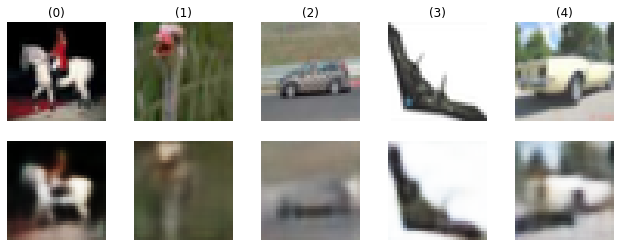

In [ ]:
fig, axs = plt.subplots(2, 5, figsize=(11, 4))

idx = 123
X_viz = X_test[idx: idx+5]
X_pred = autoencoder.predict(X_viz)

for i in range(5):
    axs[0, i].imshow(X_viz[i])
    axs[0, i].set_title(f'({i})')
    axs[0, i].axis('off')

    axs[1, i].imshow(X_pred[i])
    axs[1, i].axis('off')

Реконструкції все ще є доволі розмитими, що так само пояснюється невеликою розмірністю простору кодів.

In [ ]:
Xpr = encoder.predict(X_train)
(Xpr.mean(axis=0) == 0).sum()

0

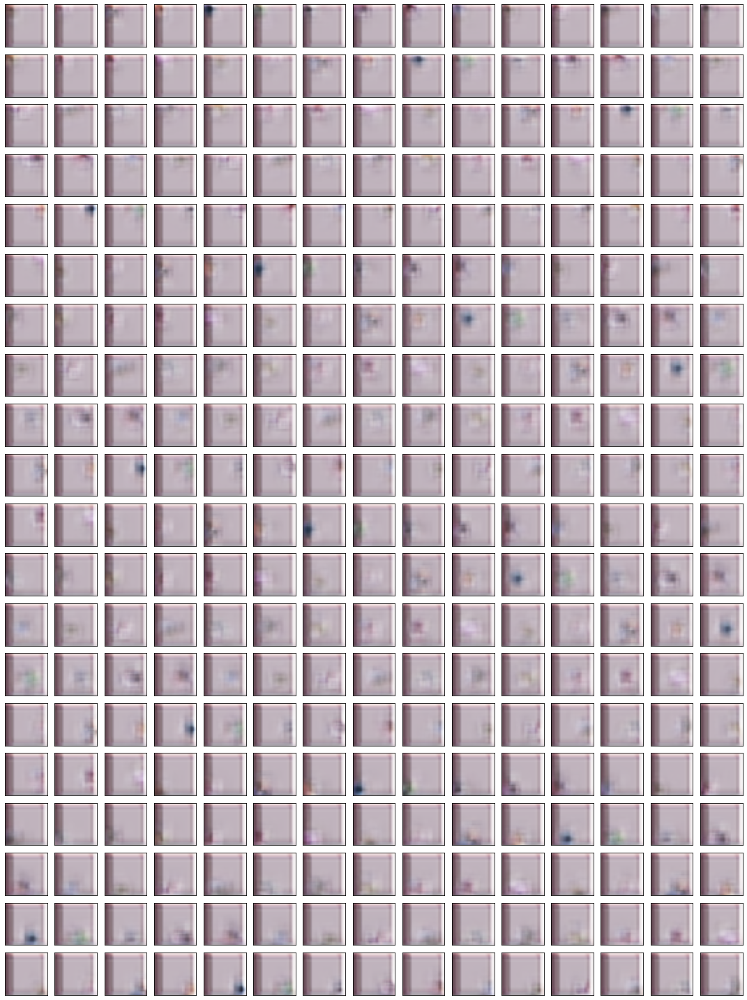

In [ ]:
codes = np.eye(304).reshape(-1, 4, 4, 19)
features = decoder.predict(codes)

fig, axs = plt.subplots(20, 15, figsize=(15, 20))

for i, ax in enumerate(axs.flatten()):
    ax.imshow(features[i])
    # ax.axis('off')
    ax.tick_params(axis='both', which='both',
                   bottom=False, top=False,
                   left=False, right=False,
                   labelbottom=False, labelleft=False)
    ax.grid(False)

plt.tight_layout()
plt.show()

В данному випадку елементи коду піддаються інтерпретації, та представляють собою хмарки конктретного кольору, форми, близької до прямокутника

## Building a classifier

In [ ]:
classifier10 = Sequential(
    [
        encoder,
        Flatten(),
        Dropout(0.5),
        Dense(10, 'softmax')
    ]
)

classifier10.compile(**classifier_compilation_params)
classifier10.fit(X_train_10, y_train_10, validation_data=(X_val, y_val),
                 callbacks=[early_stopping, TensorBoard(log_dir="logs/cnn_classifier10/")],
                 epochs=300)

Epoch 1/300
132/132 [==============================] - 5s 27ms/step - loss: 2.4884 - accuracy: 0.1293 - f1: 0.1234 - auc: 0.5364 - val_loss: 2.1463 - val_accuracy: 0.2179 - val_f1: 0.1560 - val_auc: 0.6845
Epoch 2/300
132/132 [==============================] - 2s 13ms/step - loss: 2.1421 - accuracy: 0.2037 - f1: 0.1907 - auc: 0.6730 - val_loss: 1.9340 - val_accuracy: 0.3017 - val_f1: 0.2759 - val_auc: 0.7690
Epoch 3/300
132/132 [==============================] - 2s 12ms/step - loss: 1.9751 - accuracy: 0.2925 - f1: 0.2806 - auc: 0.7488 - val_loss: 1.8863 - val_accuracy: 0.3189 - val_f1: 0.3034 - val_auc: 0.7772
Epoch 4/300
132/132 [==============================] - 2s 13ms/step - loss: 1.8364 - accuracy: 0.3417 - f1: 0.3322 - auc: 0.7919 - val_loss: 1.7289 - val_accuracy: 0.3792 - val_f1: 0.3705 - val_auc: 0.8250
Epoch 5/300
132/132 [==============================] - 2s 13ms/step - loss: 1.7762 - accuracy: 0.3611 - f1: 0.3539 - auc: 0.8094 - val_loss: 1.6658 - val_accuracy: 0.3891 - val

In [ ]:
classifier100 = Sequential(
    [
        encoder,
        Flatten(),
        Dropout(0.5),
        Dense(10, 'softmax')
    ]
)

classifier100.compile(**classifier_compilation_params)
classifier100.fit(**classifier_fit_params,
                  callbacks=[early_stopping, TensorBoard(log_dir="logs/cnn_classifier100/")],
                  epochs=300)

Epoch 58/300
1313/1313 [==============================] - 9s 7ms/step - loss: 1.1357 - accuracy: 0.5946 - f1: 0.5929 - auc: 0.9266 - val_loss: 1.2044 - val_accuracy: 0.5650 - val_f1: 0.5688 - val_auc: 0.9172
Epoch 59/300
1313/1313 [==============================] - 8s 6ms/step - loss: 1.1326 - accuracy: 0.5947 - f1: 0.5929 - auc: 0.9271 - val_loss: 1.1761 - val_accuracy: 0.5809 - val_f1: 0.5838 - val_auc: 0.9210
Epoch 60/300
1313/1313 [==============================] - 8s 6ms/step - loss: 1.1346 - accuracy: 0.5913 - f1: 0.5894 - auc: 0.9267 - val_loss: 1.1511 - val_accuracy: 0.5921 - val_f1: 0.5963 - val_auc: 0.9243
Epoch 61/300
1313/1313 [==============================] - 8s 6ms/step - loss: 1.1323 - accuracy: 0.5978 - f1: 0.5961 - auc: 0.9270 - val_loss: 1.1272 - val_accuracy: 0.5953 - val_f1: 0.6010 - val_auc: 0.9279
Epoch 62/300
1313/1313 [==============================] - 8s 6ms/step - loss: 1.1293 - accuracy: 0.5968 - f1: 0.5950 - auc: 0.9276 - val_loss: 1.2120 - val_accuracy: 0.

# Semantic Hashing

In [6]:
def plot_hash_groups(X, X_hashed, shared_hashes=None, threshold=0, rows=5, cols=5, inf_limit=-1):
    '''
    Seachs and plots array elements grouped by semantic hash
    Params:
    X             - np.ndarray of original images
    X_hashed      - np.ndarray of X elements hashes
    shared_hashes - np.ndarray of all possible hashes that the function can search for
                    if None: shared_hashes = np.unique(X_hashed)
    threshold     - maximal manhattan distance between elements in one group
                    default 0
    rows          - number of groups to plot, default 5
    cols          - maximal number of elements in group, default 5
    '''
    fig, ax = plt.subplots(rows, cols, figsize=(cols*1.7, rows*2 + 1))

    if shared_hashes is None:
        shared_hashes = np.unique(X_hashed, axis=0)
    else:
        shared_hashes = shared_hashes.copy()
    np.random.shuffle(shared_hashes)

    i = 0
    for hash in shared_hashes:
        plotted = 0
        for j in range(len(X)):
            if inf_limit <= manhattan_distance(X_hashed[j], hash) <= threshold:
              ax[i, plotted].imshow(X[j])
              ax[i, plotted].set_title(j)
              plotted += 1
              if plotted >= cols:
                  break
        if plotted > 1:
            i += 1
        if i >= rows:
            break

    for ax in ax.flatten():
        ax.axis('off')

    plt.tight_layout()

## Without noise

In [ ]:
h20_enc, h20_dec, hasher20 = create_autoencoder([768, 128, 20], noise=None, activation='sigmoid')
hasher20.compile(**compilation_params)
hasher20.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/hasher20'), early_stopping]
             )
hasher20.save('models/hasher20')

h30_enc, h30_dec, hasher30 = create_autoencoder([768, 128, 30], noise=None, activation='sigmoid')
hasher30.compile(**compilation_params)
hasher30.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/hasher30'), early_stopping]
             )
hasher30.save('models/hasher30')

h40_enc, h40_dec, hasher40 = create_autoencoder([768, 128, 40], noise=None, activation='sigmoid')
hasher40.compile(**compilation_params)
hasher40.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/hasher40'), early_stopping]
             )
hasher40.save('models/hasher40')

h64_enc, h64_dec, hasher64 = create_autoencoder([768, 128, 64], noise=None, activation='sigmoid')
hasher64.compile(**compilation_params)
hasher64.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/hasher64'), early_stopping]
             )
hasher64.save('models/hasher64')

clear_output()
print('Done')

Done


### 20-bytes hash

In [ ]:
hasher20 = tf.keras.models.load_model('models/hasher20')
h20_enc = hasher20.layers[1]
h20_dec = hasher20.layers[2]

In [ ]:
X_hashed20 = (h20_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed20, axis=0, return_counts=True)
unique.shape

(17942, 20)

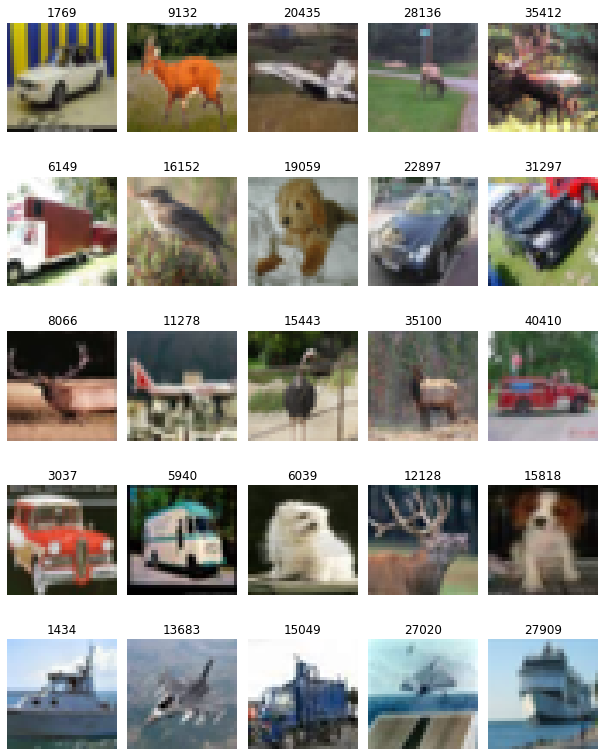

In [ ]:
plot_hash_groups(X_train, X_hashed20, unique[counts >= 5], 0)

### 30-bytes hash

In [ ]:
hasher30 = tf.keras.models.load_model('models/hasher30')
h30_enc = hasher30.layers[1]
h30_dec = hasher30.layers[2]

In [ ]:
X_hashed30 = (h30_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed30, axis=0, return_counts=True)
unique.shape

(38387, 30)

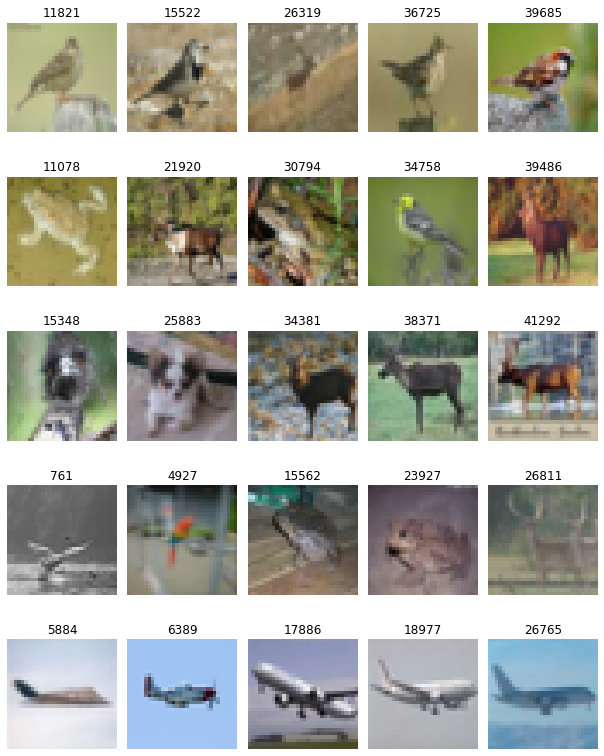

In [ ]:
plot_hash_groups(X_train, X_hashed30, unique[counts >= 5], 0)

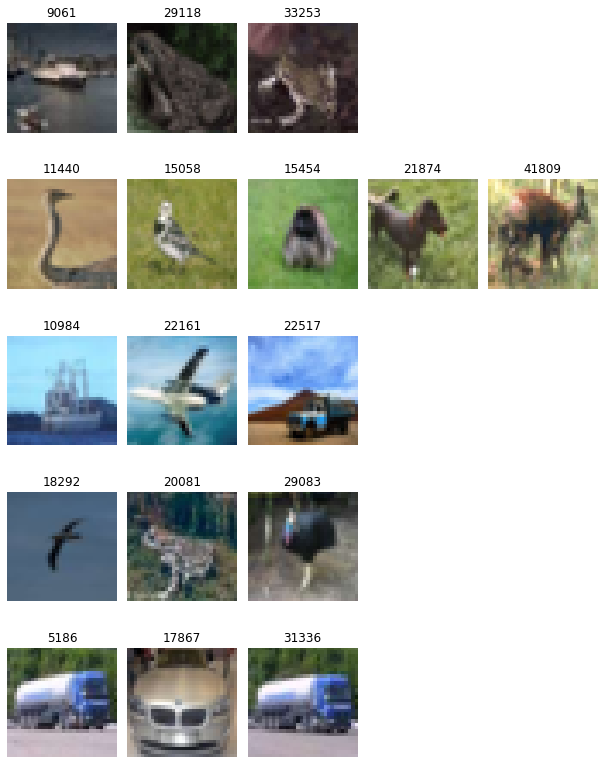

In [ ]:
plot_hash_groups(X_train, X_hashed30, unique[counts > 1], 0)

### 40-bytes hash

In [ ]:
hasher40 = tf.keras.models.load_model('models/hasher40')
h40_enc = hasher40.layers[1]
h40_dec = hasher40.layers[2]

In [ ]:
X_hashed40 = (h40_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed40, axis=0, return_counts=True)
unique.shape

(37849, 40)

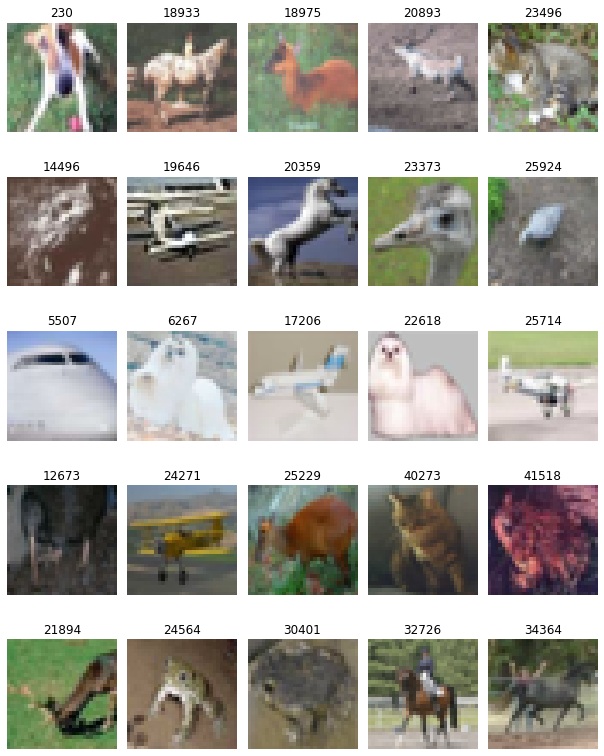

In [ ]:
plot_hash_groups(X_train, X_hashed40, unique[counts >= 5], 0)

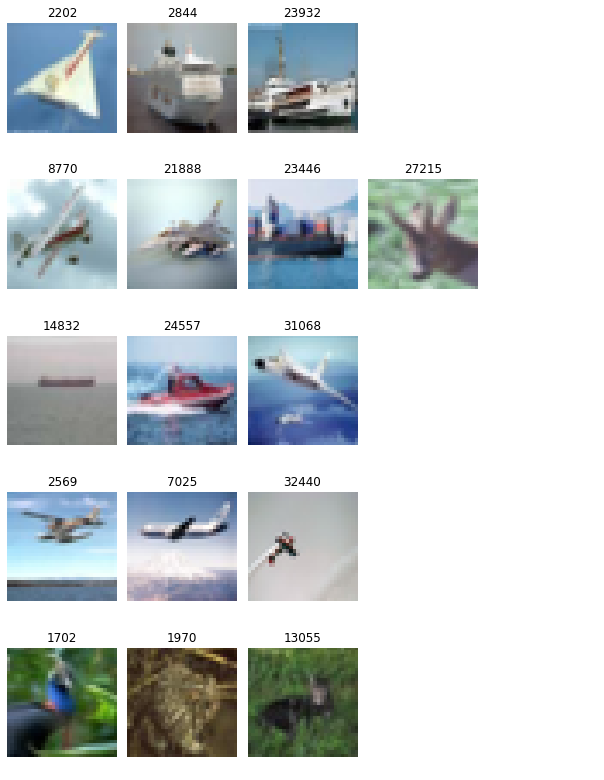

In [ ]:
plot_hash_groups(X_train, X_hashed40, unique[counts > 1], 0)

### 64-bytes hash

In [ ]:
hasher64 = tf.keras.models.load_model('models/hasher64')
h64_enc = hasher64.layers[1]
h64_dec = hasher64.layers[2]

In [ ]:
X_hashed64 = (h64_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed64, axis=0, return_counts=True)
unique.shape

(41856, 64)

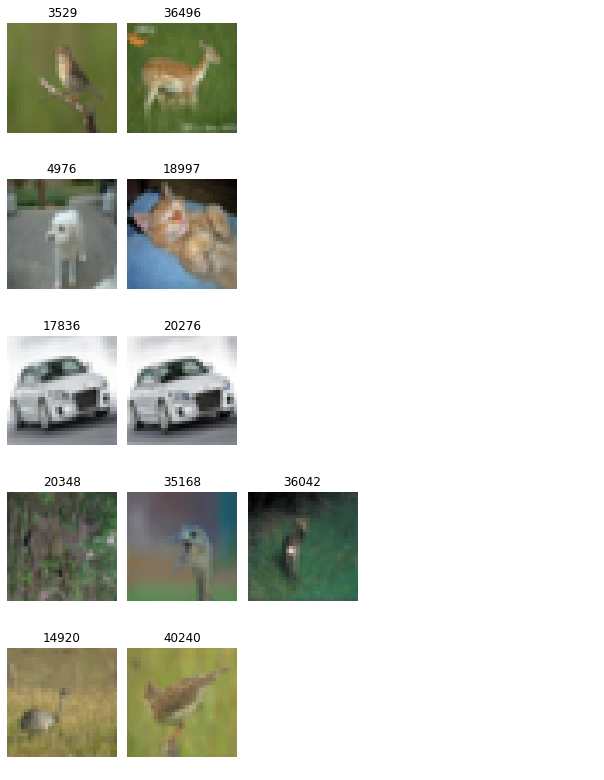

In [ ]:
plot_hash_groups(X_train, X_hashed64, unique[counts > 1], 0)

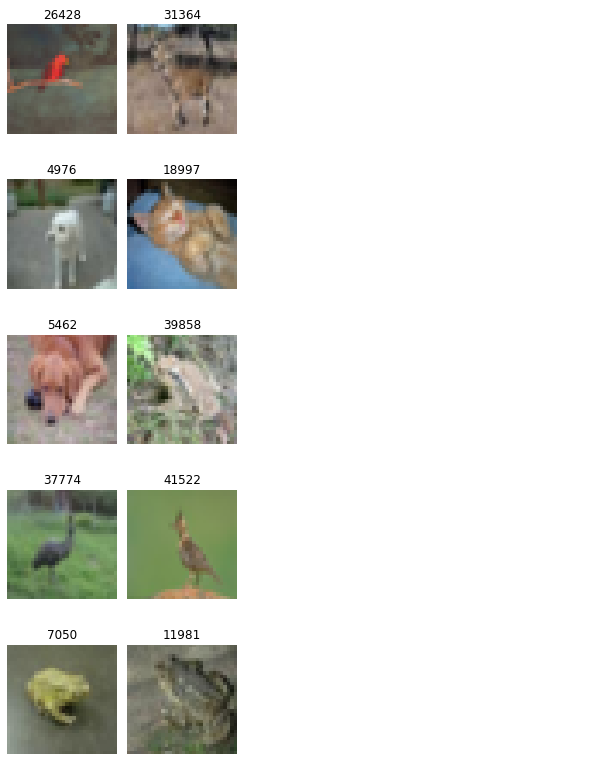

In [ ]:
plot_hash_groups(X_train, X_hashed64, unique[counts > 1], 0)

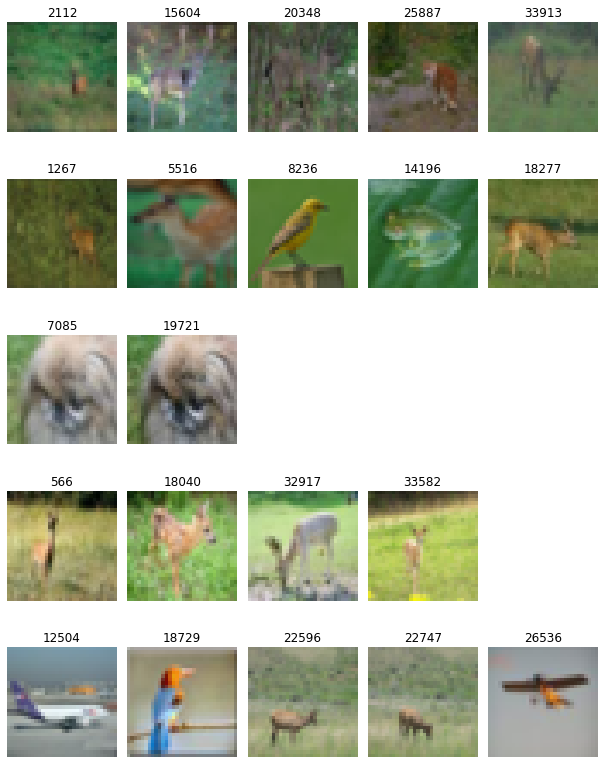

In [ ]:
plot_hash_groups(X_train, X_hashed64, unique[counts > 1], 1)

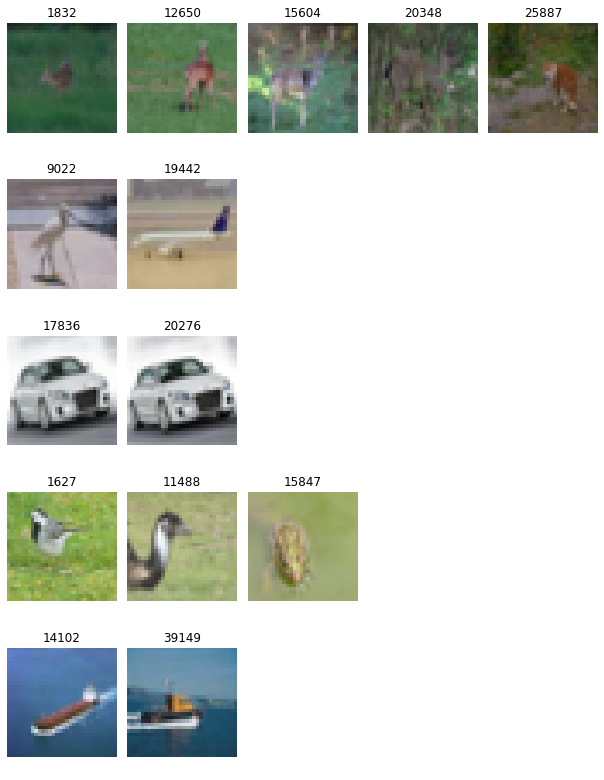

In [ ]:
plot_hash_groups(X_train, X_hashed64, unique[counts > 1], 1)

## With noise


In [ ]:
h20_enc, h20_dec, nhasher20 = create_autoencoder([768, 128, 20], noise='gaussian', noise_param=0.15, activation='sigmoid')
nhasher20.compile(**compilation_params)
nhasher20.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/nhasher20'), early_stopping]
             )
nhasher20.save('models/nhasher20')

h30_enc, h30_dec, nhasher30 = create_autoencoder([768, 128, 30], noise='gaussian', noise_param=0.15, activation='sigmoid')
nhasher30.compile(**compilation_params)
nhasher30.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/nhasher30'), early_stopping]
             )
nhasher30.save('models/nhasher30')

h40_enc, h40_dec, nhasher40 = create_autoencoder([768, 128, 40], noise='gaussian', noise_param=0.15, activation='sigmoid')
nhasher40.compile(**compilation_params)
nhasher40.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/nhasher40'), early_stopping]
             )
nhasher40.save('models/nhasher40')

h64_enc, h64_dec, nhasher64 = create_autoencoder([768, 128, 64], noise='gaussian', noise_param=0.15, activation='sigmoid')
nhasher64.compile(**compilation_params)
nhasher64.fit(**fit_params, epochs=300,
             callbacks=[TensorBoard(log_dir='logs/nhasher64'), early_stopping]
             )
nhasher64.save('models/nhasher64')

clear_output()
print('Done')

Done


### 20-bytes hash

In [ ]:
nhasher20 = tf.keras.models.load_model('models/nhasher20')
h20_enc = nhasher20.layers[1]
h20_dec = nhasher20.layers[2]

In [ ]:
X_hashed20 = (h20_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed20, axis=0, return_counts=True)
unique.shape

(20363, 20)

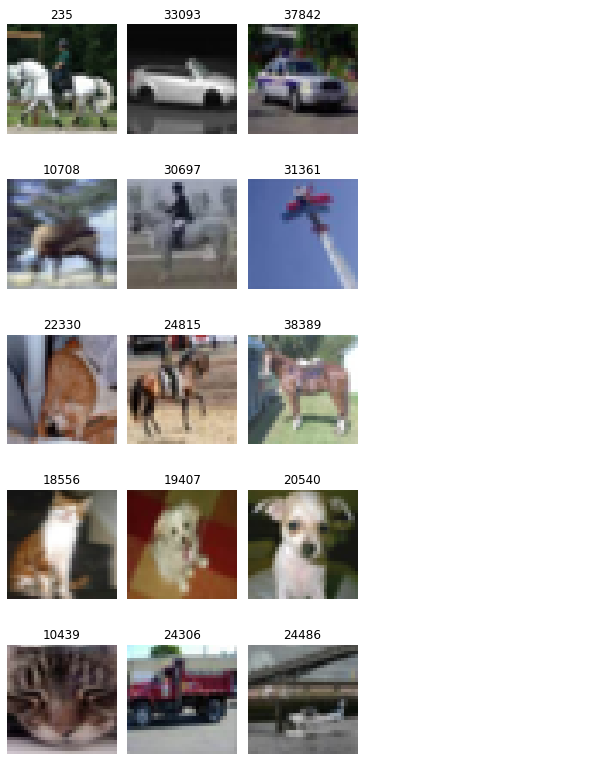

In [ ]:
plot_hash_groups(X_train, X_hashed20, unique[counts>2], threshold=0)

### 30-bytes hash

In [ ]:
nhasher30 = tf.keras.models.load_model('models/nhasher30')
h30_enc = nhasher30.layers[1]
h30_dec = nhasher30.layers[2]

In [ ]:
X_hashed30 = (h30_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed30, axis=0, return_counts=True)
unique.shape

(39187, 30)

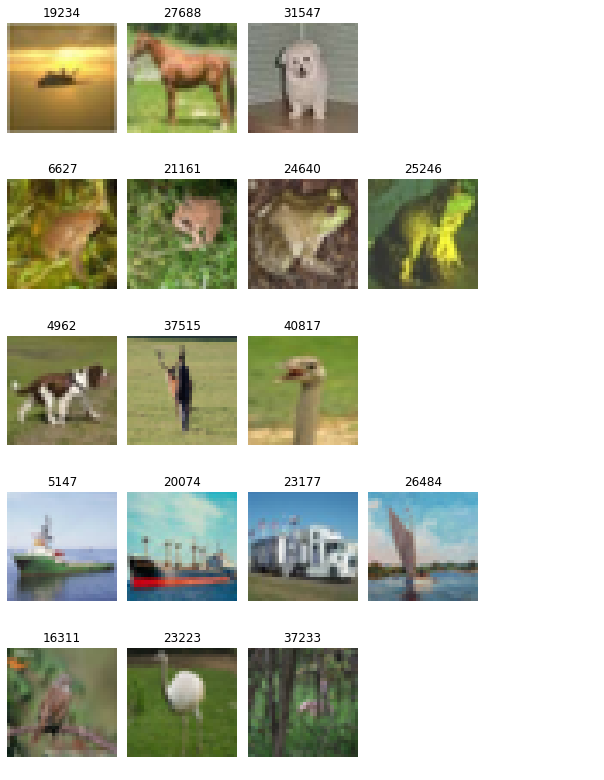

In [ ]:
plot_hash_groups(X_train, X_hashed30, unique[counts>2], threshold=0)

### 40-bytes hash

In [ ]:
nhasher40 = tf.keras.models.load_model('models/nhasher40')
h40_enc = nhasher40.layers[1]
h40_dec = nhasher40.layers[2]

In [ ]:
X_hashed40 = (h40_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed40, axis=0, return_counts=True)
unique.shape

(38635, 40)

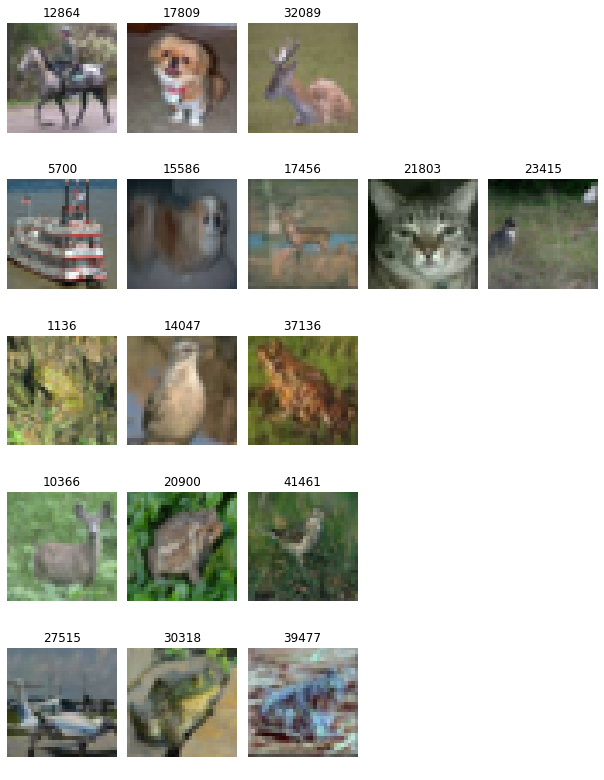

In [ ]:
plot_hash_groups(X_train, X_hashed40, unique[counts>2], threshold=0)

### 64-bytes hash

In [5]:
nhasher64 = tf.keras.models.load_model('models/nhasher64')
h64_enc = nhasher64.layers[1]
h64_dec = nhasher64.layers[2]

In [5]:
X_hashed64 = (h64_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed64, axis=0, return_counts=True)
unique.shape

(41812, 64)

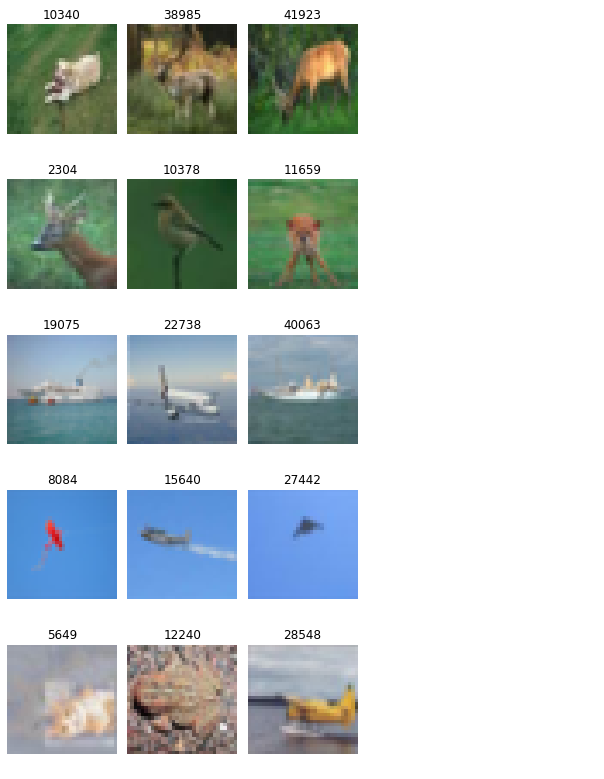

In [ ]:
plot_hash_groups(X_train, X_hashed64, unique[counts>2], threshold=0)

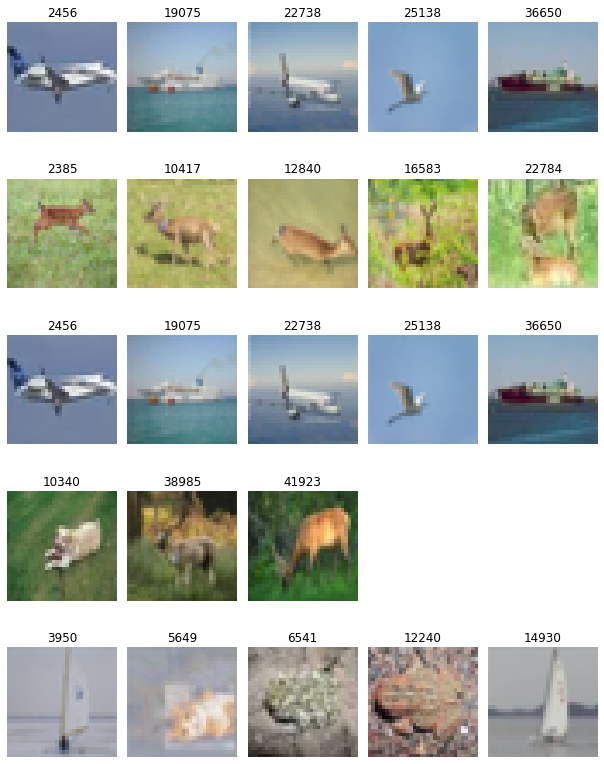

In [ ]:
plot_hash_groups(X_train, X_hashed64, unique[counts>2], threshold=1)

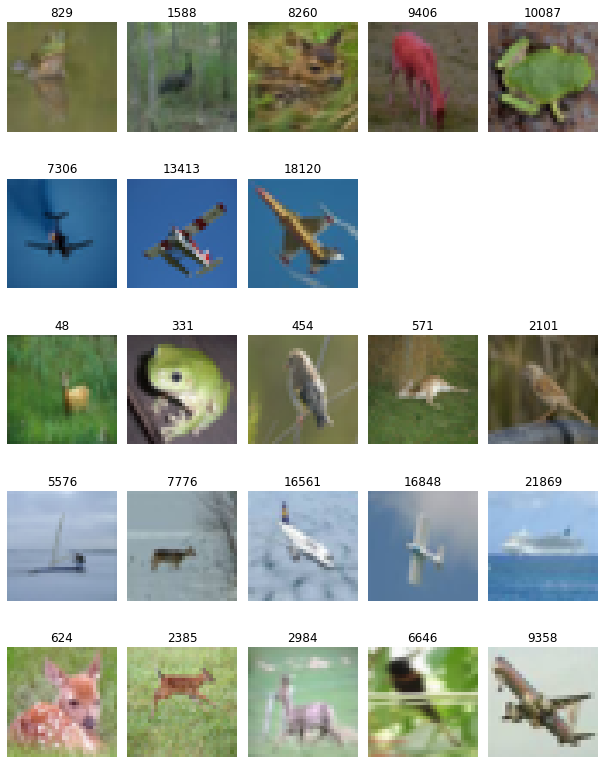

In [8]:
plot_hash_groups(X_train, X_hashed64, unique[counts>2], threshold=2, inf_limit=2)

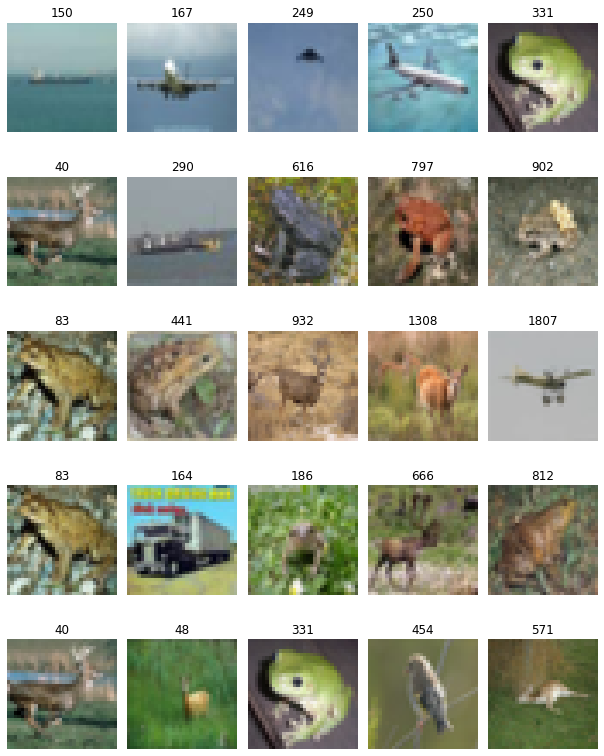

In [10]:
plot_hash_groups(X_train, X_hashed64, unique[counts>2], threshold=4, inf_limit=4)

## Using CNN

In [107]:
cnn = tf.keras.models.load_model('/content/gdrive/MyDrive/lab3_cnn/models/AugNet_bigger')
cnn.summary()

Model: "AugNet_bigger"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
RandomAugmentator (Sequentia (None, 32, 32, 3)         0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 32, 32, 48)        1344      
_________________________________________________________________
batch_normalization_30 (Batc (None, 32, 32, 48)        192       
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 32, 32, 48)        20784     
_________________________________________________________________
batch_normalization_31 (Batc (None, 32, 32, 48)        192       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 16, 16, 48)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 16, 16, 48)      

In [108]:
cnn_hasher = Model(cnn.input, cnn.layers[-3].output)

In [ ]:
X_hashed_cnn = (cnn_hasher.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed_cnn, axis=0, return_counts=True)
unique.shape

(41985, 192)

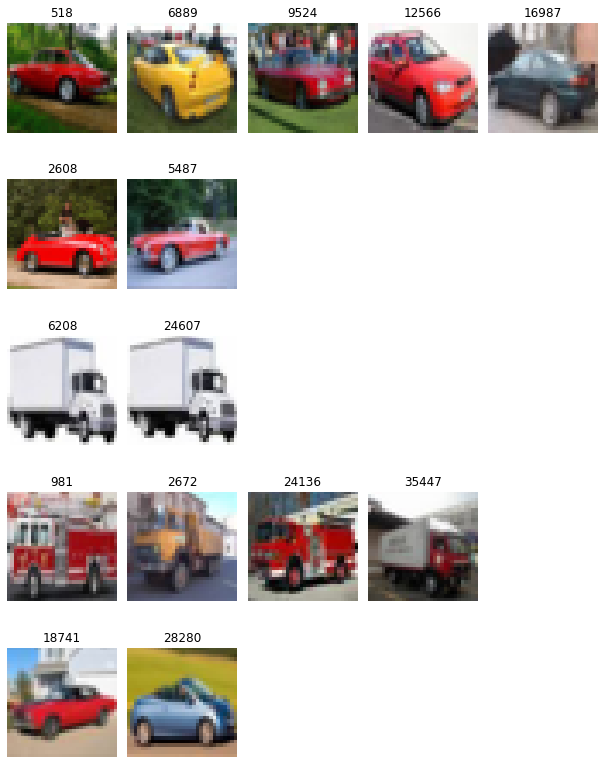

In [ ]:
plot_hash_groups(X_train, X_hashed_cnn, unique, 1)

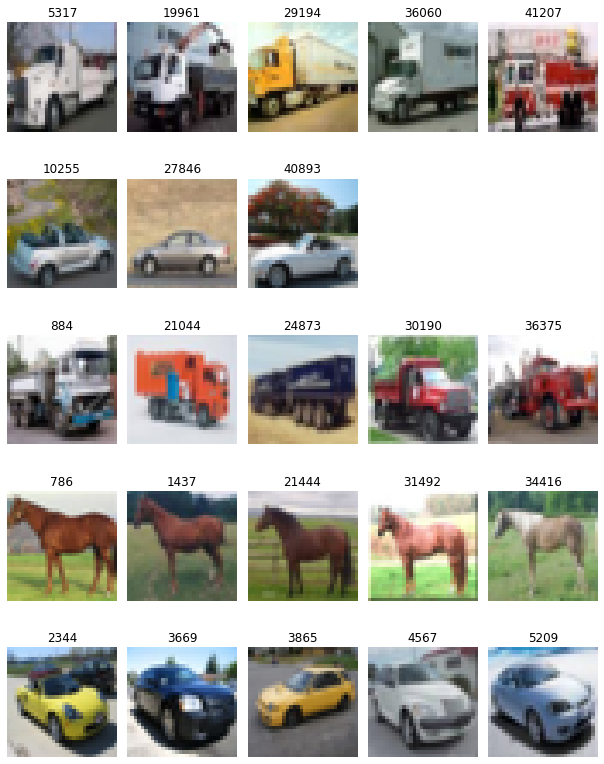

In [ ]:
plot_hash_groups(X_train, X_hashed_cnn, unique, 4)

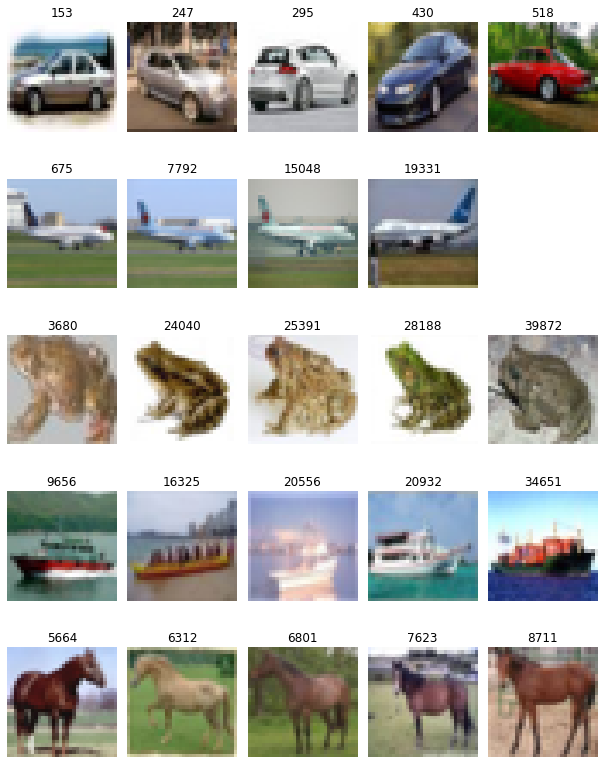

In [ ]:
plot_hash_groups(X_train, X_hashed_cnn, unique, 8)

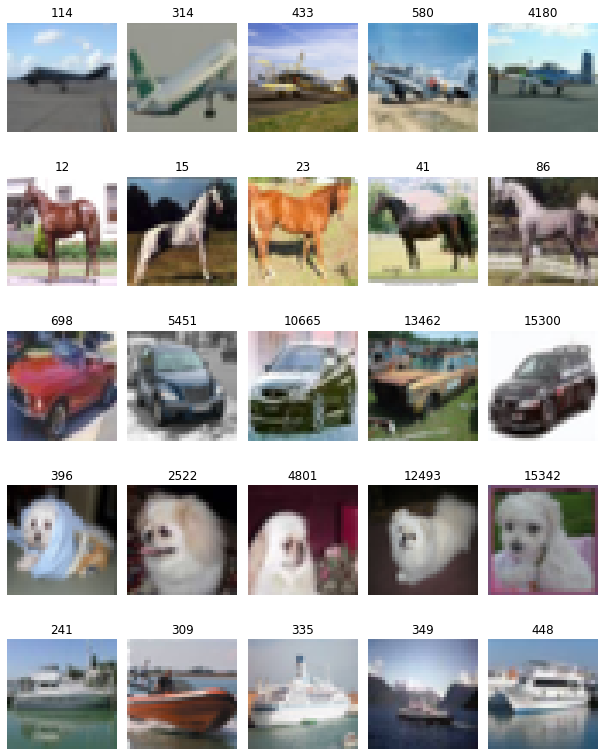

In [ ]:
plot_hash_groups(X_train, X_hashed_cnn, unique, 20)

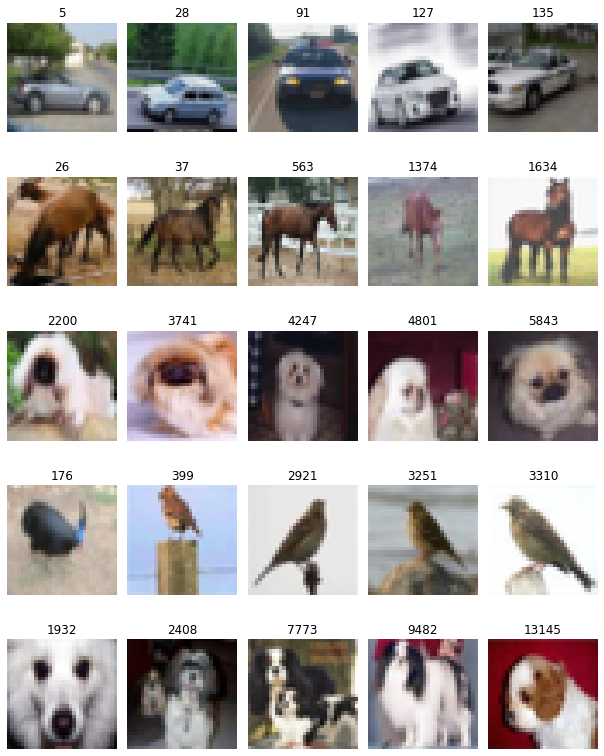

In [ ]:
plot_hash_groups(X_train, X_hashed_cnn, unique, 20)

## 192-bytes hash with Autoencoder

In [ ]:
h192_enc, h192_dec, nhasher192 = create_autoencoder([768, 384, 192], noise='gaussian', noise_param=0.15, activation='sigmoid')
nhasher192.compile(**compilation_params)
nhasher192.fit(**fit_params, epochs=500,
             callbacks=[TensorBoard(log_dir='logs/nhasher192'), early_stopping]
             )
nhasher192.save('models/nhasher192')

Epoch 1/500
1313/1313 [==============================] - 9s 4ms/step - loss: 0.6688 - val_loss: 0.6514
Epoch 2/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6414 - val_loss: 0.6358
Epoch 3/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6358 - val_loss: 0.6352
Epoch 4/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6354 - val_loss: 0.6353
Epoch 5/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6335 - val_loss: 0.6335
Epoch 6/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6260 - val_loss: 0.6256
Epoch 7/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6237 - val_loss: 0.6233
Epoch 8/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6206 - val_loss: 0.6201
Epoch 9/500
1313/1313 [==============================] - 5s 4ms/step - loss: 0.6205 - val_loss: 0.6190
Epoch 10/500
1313/1313 [==============================] - 5s 4ms/step - l

In [ ]:
nhasher192 = tf.keras.models.load_model('models/nhasher192')
h192_enc = nhasher192.layers[1]

In [ ]:
X_hashed192 = (h192_enc.predict(X_train) > 0.5).astype('int')
unique, counts = np.unique(X_hashed192, axis=0, return_counts=True)
unique.shape

(41828, 192)

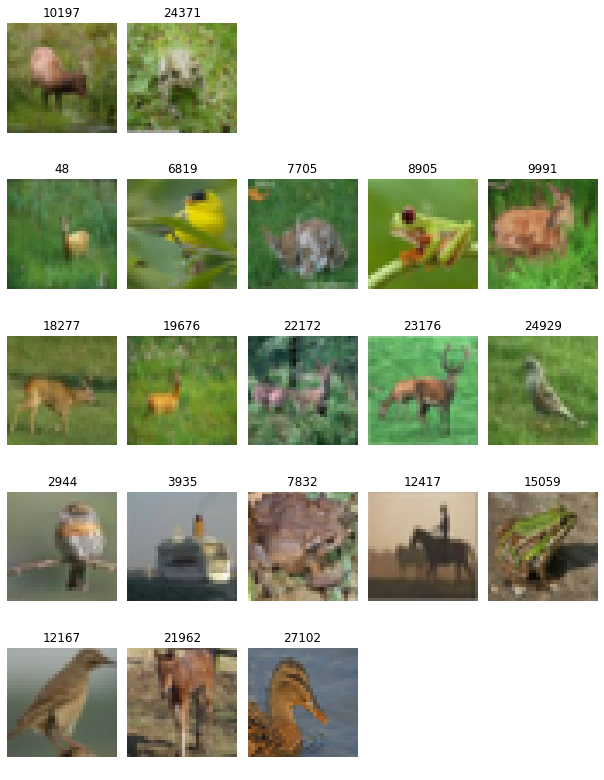

In [ ]:
plot_hash_groups(X_train, X_hashed192, unique, threshold=3)

З результатів видно, що однакові або подібні хеші дійсно отримують зображення, які в деякому сенсі схожі, проте як видно з утворених групп, результат має дещо різний характер: автоенкодери наділяються зображення хешем спираючись на більш низькорівневі ознаки, здебільшого на кольорову гамму, в той час як шари згорткового классифікатора групують зображення за високорівневими ознаками,такими як поза центрального об'єкту. Також, слід зауважити, що кількість унікальних хешів виявилась дуже великою в усіх випадках, при чому розбіжність в хешах утворених автокодувальниками, як правила, гарантує не схожі між зобою зобреження, в той час, як результати згорткової мережі допускають відносно велику різницю між хешами, при цьому зображення все ще можна вважати схожими.

## Results

### Distance functions between two boolean vectors

Спробуємо кластеризувати зображення за схожістю хеша.

Розглянемо різні метрики несхожості векторів простору $\{0, 1\}^n$, представлені в [scipy](https://docs.scipy.org/doc/scipy/reference/spatial.distance.html)

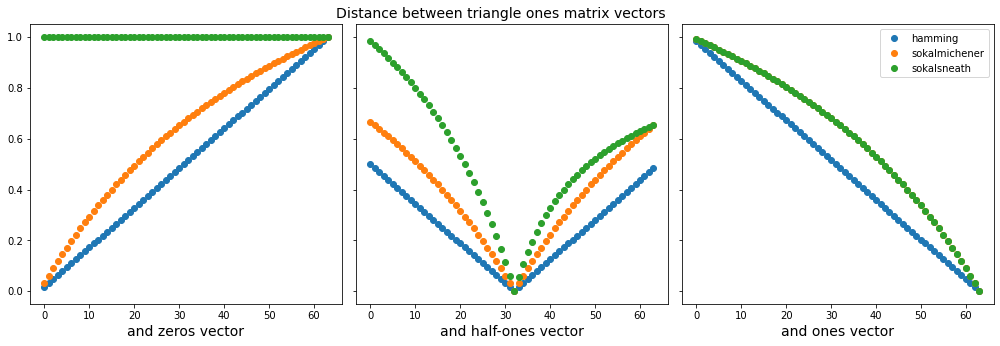

In [15]:
from scipy.spatial.distance import cdist
pnum = 64

A = np.tril(np.ones((pnum, pnum)))
x0 = np.zeros((1, pnum))
x1 = np.ones((1, pnum))
x_mid = A[int(pnum/2)].reshape((1, pnum))

metrics = [
           'hamming',
          #  'jaccard',
          #  'rogerstanimoto',
           'sokalmichener',
           'sokalsneath',
          #  'kulsinski',
          #  'yule'
           ]
fig, ax = plt.subplots(1, 3, figsize=(14, 14/3), sharey=True)
for metric in metrics:
    dist = cdist(x0, A, metric)
    ax[0].plot(dist.flatten(), 'o', label=metric)
    dist = cdist(x1, A, metric)
    ax[2].plot(dist.flatten(), 'o', label=metric)
    dist = cdist(x_mid, A, metric)
    ax[1].plot(dist.flatten(), 'o', label=metric)
plt.suptitle("Distance between triangle ones matrix vectors", y=1.02, fontsize=14)
ax[0].set_xlabel('and zeros vector', fontsize=14)
ax[1].set_xlabel('and half-ones vector', fontsize=14)
ax[2].set_xlabel('and ones vector', fontsize=14)
plt.legend();
plt.tight_layout();

Спробуємо використати Sokal-Sneath dissimilarity, що розраховується як $$\text{Sokal-Sneath}(u, v) = \frac{R}{C_{TT}+R}$$ де $C_{TT}$ - кількість координат, що є одиницею в обох векторах, $R$ - подвоєна кількість координат, що приймають різні значення в двох векторах.

Таким чином, ця метрика не є симметричною відносно операції заперечення координат: чим більше ознак співпадають в обох векторах, тим менше враховується розбіжність в інших координатах.

### Clustering
Застосуємо алгоритм кластеризації DBSCAN до отриманої множини хешів, для нас ключовими є наступні його переваги:
- не потребує апріорного визначення кількості кластерів
- автоматично визначає віддалені точки як шум

Мінімальний розмір кластера оберемо в три точки, максимальна відстань, на якій точки вважатимуться сусідами, емпірично підібрана як 0.26 (вибір занадто великого значення призводить до формування великого кластеру непов'язаних елелементі, занадто малого - до відсутності кластеризації як такої), метрика відстані Sokal-Sneath dissimilarity.

In [6]:
from sklearn.cluster import DBSCAN

X_hashed_val64 = (h64_enc.predict(X_val) > 0.5).astype('int')

cluster,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
examples,8816,31,24,25,4,7,3,3,3,6,4,4,3,5,3,3,12,3,5,3,3,3,3,3,3,3,3,3,3,3,3


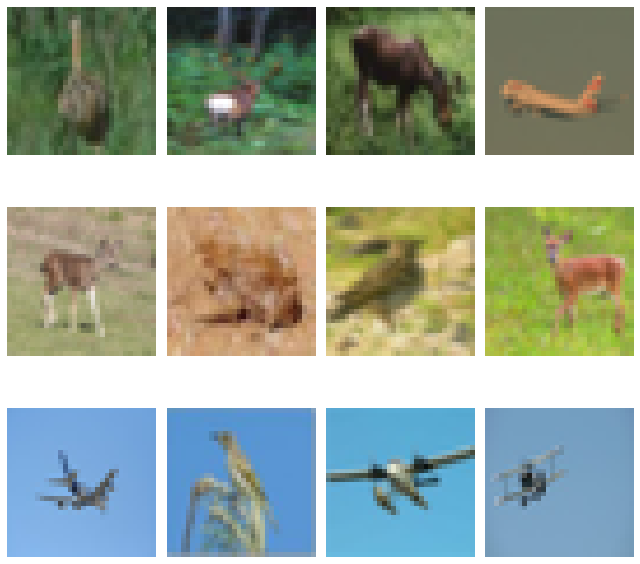

In [8]:
db64 = DBSCAN(eps=0.26, min_samples=3, metric='sokalsneath', n_jobs=-1).fit(X_hashed_val64)
display(pd.DataFrame(
    np.unique(db64.labels_, return_counts=True), index=('cluster', 'examples')
  ).T.set_index('cluster').T
)

fig, ax = plt.subplots(3, 4, figsize=(9,9))
for i, cluster in enumerate([0, 1, 2]):
    for j, x in enumerate(X_val[db64.labels_ == cluster][10:14]):
        ax[i, j].imshow(x)
        ax[i, j].axis('off')
plt.tight_layout()

Порівняємо з використаною раніше манхеттенською відстаню ("manhattan", "cityblock", "l1" <=> "hamming" в данному просторі)

cluster,-1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
examples,8912,24,3,11,3,3,3,3,4,3,5,5,3,3,3,6,3,3


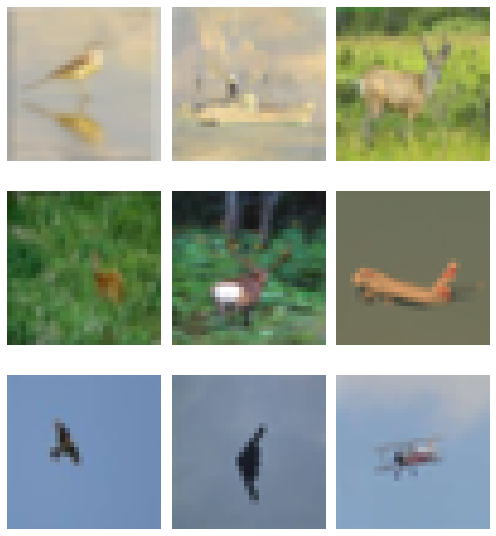

In [9]:
db64 = DBSCAN(eps=1/64, min_samples=3, metric='hamming', n_jobs=-1).fit(X_hashed_val64)
display(pd.DataFrame(
    np.unique(db64.labels_, return_counts=True), index=('cluster', 'examples')
  ).T.set_index('cluster').T
)

fig, ax = plt.subplots(3, 3, figsize=(7,8))
for i, cluster in enumerate([0, 1, 2]):
    for j, x in enumerate(X_val[db64.labels_ == cluster][:3]):
        ax[i, j].imshow(x)
        ax[i, j].axis('off')
plt.tight_layout()

Отримуємо ідентичні за суттю кластери, проте за метрикою Sokal-Sneath їх виявилось більше, та вони містять більше елементів, а отже ця метрика дійсно краще підходить для нашої задачі.

### Comparing
Головним питанням залишається числова оцінка якості хешування.

Послідовність дій для кожної моделі була обрана наступною:
1. Хєшуємо валідаційну вибірку
2. Кластеризуємо отриману множину хешів алгоритмом DBSCAN
3. Точки, визначені як шум, відкидаються
4. Для кожного кластера розраховуємо наступні метрики:
  - Індекс забруднення (домішки) Джині: $1 - \sum^N_{i=1}p_i$,\
  де $p_i$ - частота зустрічі елементів $i$-того класу (з N можливих) в даному кластері. \
  Прямує до нуля, якщо кластер містить здебільшого елементи одного класу.
  - Середнє покоординатних дисперсій: $\frac{1}{3nm}\sum^{n,m,3}_{i,j,a} \sigma^2_{ija}$, $(n,m,3)$ - розмірність зображення.\
  Як метрика, що визначає розбіжність в кольорах елементів кластера.
  - Середнє поокординатних дисперсій для зображень конвертованих в відтінки сірого, аналогічно попередньому, але для $J(i,j) = \frac{1}{3}(I(i,j,1)+I(i,j,2)+I(i,j,3))$.
  Як метрика, що визначає розбіжність в інтенсивності кольорів елементів кластера.
5. Середні значення отриманих метрих представляють оцінку якості кластеризації. Додатково включаються значення кількості кластерів, їх середній розмір, кількість точок позначених як шум.

In [9]:
def mean_elementwise_variance(cluster, grayscale=False):
    if grayscale:
        return cluster.mean(axis=-1).var(axis=0).mean()
    return cluster.var(axis=0).mean()

def mean_oneout_mse(cluster):
    m = len(cluster)
    I = np.eye(m).astype('bool')
    mse = [ np.mean((cluster[~i] - cluster[i])**2) for i in I]
    return np.mean(mse)

def gini_impurity(A):
    return 1 - ( (np.unique(A, axis=0, return_counts=True)[1] / A.shape[0])**2 ).sum()


def evaluate_clustering(labels_, X, y):
    cluster_numbers, cluster_counts = np.unique(labels_, return_counts=True)
    cluster_counts = cluster_counts[cluster_numbers > -1]
    cluster_numbers = cluster_numbers[cluster_numbers > -1]

    cluster_idx = [labels_ == i for i in cluster_numbers]

    var = [mean_elementwise_variance(X[idx]) for idx in cluster_idx]
    gvar = [mean_elementwise_variance(X[idx], True) for idx in cluster_idx]

    gini = [gini_impurity(y[idx]) for idx in cluster_idx]

    return {
        'Mean elementwise var': np.mean(var),
        '(greyscale)': np.mean(gvar),
        'Gini impurity': np.mean(gini),
        'Noise': np.sum(labels_ == -1),
        'Clusters': len(cluster_numbers),
        'Average size': np.mean(cluster_counts)
        }

In [21]:
cnn = tf.keras.models.load_model('/content/gdrive/MyDrive/lab3_cnn/models/AugNet_bigger')
cnn_hasher = Model(cnn.input, cnn.layers[-3].output)

models = [f'hasher{i}' for i in (20,30,40,64)]
models += ['n'+h for h in models]
models += [cnn_hasher, 'nhasher192']

In [10]:
from sklearn.cluster import DBSCAN
from tqdm.notebook import tqdm

def clusterize_validation_set(eps):
    rows = []

    for encoder_ in tqdm(models):
        if isinstance(encoder_, str):
            encoder = tf.keras.models.load_model('models/'+encoder_).layers[1]
        else:
            encoder = encoder_

        X_hashed = (encoder.predict(X_val) > 0.5).astype('int')
        hash_len = X_hashed.shape[1]
        dbscan = DBSCAN(eps=eps, min_samples=3, metric='sokalsneath', n_jobs=-1)
        dbscan.fit(X_hashed)

        rows.append(
            evaluate_clustering(dbscan.labels_, X_val, y_val)
            )
    df = pd.DataFrame(rows)
    df.index = pd.MultiIndex.from_tuples(
        [("Without noise", i) for i in (20,30,40,64)] + 
        [("With noise", i) for i in (20,30,40,64)] + 
        [("192 bytes", 'CNN'), ("192 bytes", 'Autoencoder')]
        )
    return df

In [24]:
clusterize_validation_set(0.26)

Mean elementwise var  ...  Average size
Without noise 20                       0.023448  ...     12.457516
              30                       0.019681  ...      7.080460
              40                       0.020686  ...     19.592920
              64                       0.009750  ...      5.000000
With noise    20                       0.022303  ...     11.659243
              30                       0.021931  ...      9.771574
              40                       0.016991  ...     13.220000
              64                       0.011191  ...      6.133333
192 bytes     CNN                      0.038878  ...    100.125000
              Autoencoder              0.010158  ...     17.647059

[10 rows x 6 columns]

Отримані результати підтверджують нашу інтуіцію стосовно принципу кластеризації: згорткова мережа демонструє найгірший результат за середньою дисперсією координат, проте утворює порівняно великі кластери з дуже низьким рівнем забруднення Джині відносно дійсних міток зображень, а отже ці кластери формують зображення однакових об'єктів, як ми переконались раніше, в схожих положеннях.

Автокодувальники продемонстрували суттєво вищий рівень забрудненості Джині: близько половини зображень в кластері є "домішкою" відносно домінуючого класу, проте, як вже було помічено, вони формують менші кластери за принципом подібності кольорової гамми, що і підтверджують значення середньої покоординатної дисперсії.

Серед автоенкодерів найкращі результати демонструють моделі з більшою розмірністю хешу, моделі кодування в 64-мірний вектор з та без додавання шуму, а також модель шумопригнічуючого кодувальника в 192-мірних простір. Вибирати найкращу з цих моделей потрібно з урахуванням конкретної задачі, адже кожна з них відрізняється не лише за диспесіями координат, але й за кількістю сформованих кластерів та їх розмірами.

З початкових моделей хешування в 20,30,40 вимірний простір остання є найкращою: ймовірно, має місце недонавчання автоенкодера з кодуючим шаром такої розмірності.

Спробуємо зменшити основний гіпер-параметр DBSCAN, максимальну відстань між сусідніми точками

In [168]:
clusterize_validation_set(0.22)

Mean elementwise var  ...  Average size
Without noise 20                       0.022628  ...      6.333333
              30                       0.016229  ...      5.159091
              40                       0.018052  ...     12.525000
              64                       0.008649  ...      4.538462
With noise    20                       0.021765  ...      6.623552
              30                       0.019132  ...      6.920000
              40                       0.016128  ...      5.505051
              64                       0.008973  ...      5.062500
192 bytes     CNN                      0.039626  ...     75.136364
              Autoencoder              0.009677  ...     10.230769

[10 rows x 6 columns]

Кластери, які очікувалось, зменшились, кількість точок позначених як шум збільшилось. Висновки за отриманими метриками можна зробити такі ж, а отже процедура оцінювання результатів обрана коректно. 

## Combined hash

В якості останнього експерименту, спробуємо скомбінувати результати отримані з використанням згорткової мережі та автокодувальника, та створити більш змістовний хеш шляхом конкатенації двух попередніх. Таким чином отриманий хеш повинен містить інформацію як про низькорівневі ознаки так і про високорівневі.

In [4]:
cnn = tf.keras.models.load_model('/content/gdrive/MyDrive/lab3_cnn/models/AugNet_bigger')
cnn_hasher = Model(cnn.input, cnn.layers[-3].output)

enc_hasher = tf.keras.models.load_model('models/nhasher192').layers[1]

In [7]:
hashes_cnn = (cnn_hasher.predict(X_val) > 0.5).astype('int')
hashes_enc = (enc_hasher.predict(X_val) > 0.5).astype('int')

combined_hashes = np.hstack([hashes_cnn, hashes_enc])
combined_hashes.shape

(9000, 384)

In [13]:
dbscan = DBSCAN(eps=0.26, min_samples=3, metric='sokalsneath', n_jobs=-1)
dbscan.fit(combined_hashes)

pd.DataFrame(evaluate_clustering(dbscan.labels_, X_val, y_val), index=["combined"])

,Mean elementwise var,(greyscale),Gini impurity,Noise,Clusters,Average size
combined,0.010619,0.009558,0.0,8938,12,5.166667


In [20]:
pd.DataFrame(
    np.unique(dbscan.labels_, return_counts=True), index=('cluster', 'examples')
).T.set_index('cluster').T

cluster,-1,0,1,2,3,4,5,6,7,8,9,10,11
examples,8938,22,4,3,5,3,3,6,4,3,3,3,3


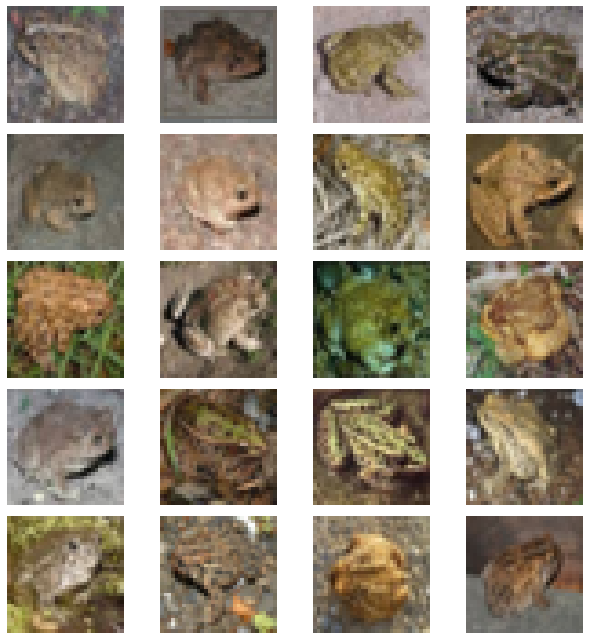

In [24]:
X0 = X_val[dbscan.labels_ == 0]
fig, ax = plt.subplots(5, 4, figsize=(9,9))
for i, ax in enumerate(ax.flatten()):
    ax.imshow(X0[i])
    ax.axis('off')
plt.tight_layout()

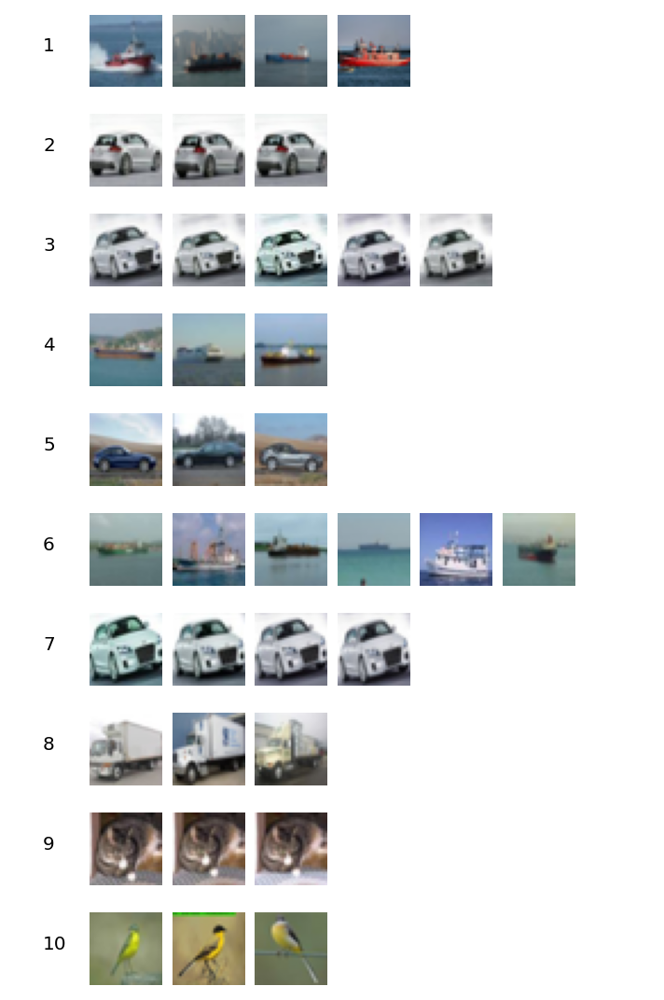

In [38]:
fig, ax = plt.subplots(10, 8, figsize=(10,15))
for i, cluster in enumerate(range(1,11)):
    ax[i, 0].text(0.5, 0.5, cluster, fontsize=20)
    for j, x in enumerate(X_val[dbscan.labels_ == cluster]):
        ax[i, j+1].imshow(x)
for ax in ax.flatten():
    ax.axis('off')
plt.tight_layout()

Отримана система показує гарні результати в плані знаходження дублікатів, а також групує дійсно дуже схожі зображення в один кластер. В залежності від поставленної задачі чутливість такої системи повинна бути збільшена (для пошуку дублікатів) або зменшена (для группування), це може бути здійснено підбором гіперпараметрів кластеризації, можливо заміною метрики на більш підходящу, наприклад, зі зваженими значеннями розбіжності в першій та другій частині хеша.

# Learning curves with TensorBoard

In [ ]:
%tensorboard --logdir logs